<a href="https://colab.research.google.com/github/nishantkapps/aiml-projects/blob/main/Final_Capstone_Project_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Authors: Feb23-A-Group9**

<li> Ravi N
<li> Rohith Pathak
<li> Venkat Nellutla
<li> Swapnil Tajane
<li> Nishant Killedar

# **Project: *Capstone* - FOOD DETECTION/CLASSIFICATION (CV)**

# **Milestone 1 : EDA, Basic CNN (Model 2,3,4)**

## Steps

<li> Unzip images into respective folders in google drive
<li> Review counts of images per class<br>
&emsp; &emsp; <i>This should be around 1000 images per class</i>
<li> Resize all images to 224 X 224 (as it is supported by pretrained algos)
<li> <font color='green'><b>Manual</b></font> : Select 50 images from each class
<li> <font color='green'><b>Manual</b></font> : Annotate the images using Makesense tool <br>
&emsp;&emsp;<i>Each image should have only one rectangular bounding box</i>
<li> <font color='green'><b>Manual</b></font> : Upload the annotation file (.csv) to each class folder
<li> Convert all images to RGB format for consistency
<li> Read images from the directory and print a few images
<li> Check if all images are of size 224 X 224
<li> Build a basic CNN model
<li> Split the images into train & test ( 70:30 )
<li> Train the CNN model
<li> Check for accuracy of prediction
<li> Print a few images from test (unseen) & predicted class

## Environment

In [ ]:
# Initialize Environment
from google.colab import drive, files
drive.mount('/content/drive/',force_remount=True)

Mounted at /content/drive/


## Global Imports

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv2
import os, sys
import glob
from os import listdir
from os.path import isfile, join
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.utils import to_categorical
from keras.layers import Dense, Dropout, InputLayer, BatchNormalization, Flatten, GlobalAveragePooling2D, Conv2D, MaxPool2D, GlobalMaxPool2D
from keras.models import Sequential
from keras.optimizers import Adam, RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger

## Model 2 : Trained on smaller dataset 10 classes

### Some utilities

In [ ]:
class ScoreUtils(object):
  '''Utility class for scoring
  '''

  @staticmethod
  def get_scores ( actual_data, pred_data, data_name ) :
    '''Get score from given actual_data and predicted_data'''
    a_score = round(metrics.accuracy_score(actual_data,pred_data)*100,2)
    r_score = round(metrics.recall_score(actual_data,pred_data,average='micro')*100,2)
    p_score = round(metrics.precision_score(actual_data,pred_data,average='micro')*100,2)
    f1_score = round(metrics.f1_score(actual_data,pred_data,average='micro')*100,2)
    cr = metrics.classification_report(actual_data, pred_data)
    return ( a_score, r_score, p_score, f1_score, cr, data_name )

  @staticmethod
  def print_scores ( s ) :
    '''Print the given score'''
    ( a_score, r_score, p_score, f1_score, cr, data_name ) = s
    print ( "Scores for {}\n".format(data_name) )
    print ( "Accuracy score for {}: {}".format(data_name, a_score))
    print ( "Recall score for {}: {}".format(data_name, r_score))
    print ( "Precision score for {}: {}".format(data_name, p_score))
    print ( "F1 score for {}: {}".format(data_name, f1_score))
    print ( "\nClassification report for {}:\n{}\n\n".format(data_name, cr))

  @staticmethod
  def scores_to_dataframe ( s ) :
    '''Convert the score tuple into a pandas DataFrame'''
    ( a_score, r_score, p_score, f1_score, cr, data_name ) = s
    myscoredf = pd.DataFrame ( s[0:4], columns = ['Score'], index = ['Accuracy', 'Recall', 'Precision', 'F1'] )
    return myscoredf

  @staticmethod
  def scores_difference ( score_base, score_new, data_name='' ) :
    '''Compute difference between two given scores'''
    df_score_base = ScoreUtils.scores_to_dataframe(score_base)
    df_score_new = ScoreUtils.scores_to_dataframe(score_new)
    tmp = df_score_new - df_score_base
    print ( "Difference in performance {}:\n{}".format(data_name,tmp) )
    return tmp

  @staticmethod
  def plot_loss (h_) :
    plt.plot(h_.history['loss'])
    plt.plot(h_.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='best')
    plt.show()

  @staticmethod
  def plot_accuracy (h_) :
    plt.plot(h_.history['accuracy'])
    plt.plot(h_.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='best')
    plt.show()

In [ ]:
class ImageUtils(object):
  '''Utility methods around images
  '''
  @staticmethod
  def print_image_info (image):
    print("Image dimension: {} x {}, channels: {}".format(image.shape[0],image.shape[1],image.shape[2]))

  @staticmethod
  def plot_image(img, label=""):
    plt.suptitle(label)
    plt.imshow(img)
    plt.show()

  @staticmethod
  def plot_image_grayscale(img, label=""):
    cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

  @staticmethod
  def plot_image_pair(img1, img2):
    '''Plot 2 images side by side'''
    plt.subplot(121)
    plt.imshow(img1)
    plt.subplot(122)
    plt.imshow(img2)
    plt.show()

  @staticmethod
  def plot_images(images):
    '''Plot images side by side'''
    num = len(images)
    for i in range(0, num):
      plt.subplot(1,num,i+1)
      plt.imshow(images[i])
    plt.show()

  @staticmethod
  def image_num_channels(image) :
    '''image ndarray of shape (height,width,channels)'''
    if(image.ndim == 2):
      return 1
    elif(image.ndim == 3):
      return image.shape[2]
    else:
      assert 0

  @staticmethod
  def resize_image(image, new_dim):
    '''Resize a given image to given dimensions
    image - The image to resize, ndarray(height,width,channels)
    new_dim - tuple of (new_width, new_height)'''
    new_width = new_dim[0]
    new_height = new_dim[1]
    return cv2.resize(image, dsize=(new_width, new_height), interpolation=cv2.INTER_CUBIC)

  @staticmethod
  def resize_images(images, new_dim, fix_channels):
    '''Resize the given images'''
    images_resized = np.empty(images.shape[0],dtype=object)
    for i in range(0, images.shape[0]) :
      #print("Resizing image: ", i)
      resized_image = ImageUtils.resize_image(images[i], new_dim)
      if (fix_channels) :
        if(ImageUtils.image_num_channels(resized_image) == 1):
          # Black and white image
          resized_image = cv2.merge((resized_image,resized_image,resized_image))
        if(ImageUtils.image_num_channels(resized_image) == 4):
          resized_image = cv2.cvtColor(resized_image, cv2.COLOR_RGBA2RGB)
      images_resized[i] = resized_image
    return images_resized

  @staticmethod
  def unroll_images(images, dim):
    '''Unroll images to be used in model
    '''
    unrolled_images = np.empty(dim, dtype = np.uint8)
    for i in range(0,images.shape[0]):
      unrolled_images[i] = images[i]
    return unrolled_images

  @staticmethod
  def rectangle(image, rect):
    img = np.copy(image)
    for rect in rect:
      print("Rectangle: {}".format(rect))
      cv2.rectangle(img, rect, (0, 0, 255), 2)
    return img

  @staticmethod
  def plot_with_rectangle(img, rects):
    '''rect np.array([[10,5,20,30], [10,5,20,30]], np.int32)
    '''
    assert rects.ndim == 2
    if len(rects) :
      tmp_img = ImageUtils.rectangle(img, rects)
      cv2_imshow(cv2.cvtColor(tmp_img, cv2.COLOR_RGB2BGR))
    else:
      cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
      print("No face identified in the image")

In [ ]:
# For testing when we want to run on small set of images. 0 means no limit.
FOOD_ITEM_IMAGE_LIMIT = 0

class ZipUtils(object):
  '''A utility class for managing zip file
  '''

  def __init__(self, file_path):
    self.file_path = file_path
    self.zip_file = ZipFile(self.file_path, 'r')
    self.infolist = self.zip_file.infolist()

  def scan_files(self):
    '''Generate a list of files/directories in the zip file
    '''
    self.directory_count = 0
    self.file_extensions = { }
    directories = [ ]
    files = [ ]
    i = 0
    for info in self.infolist :
      if(info.is_dir()):
        directories.append(info.filename)
      else:
        ext = os.path.splitext(info.filename)
        if not ext in self.file_extensions.keys() :
          self.file_extensions[ext] = 0
        self.file_extensions[ext] += 1
        files.append(info.filename)
        i += 1
        if ( i == FOOD_ITEM_IMAGE_LIMIT ):
          break
    self.directories = np.array(directories)
    self.files = np.array(files)
    print("Total directories: {}, files: {}".format(self.num_directories(), self.num_files()))

  def file_bytes(self, file_path):
    '''Get the bytes for a given file
    '''
    return self.zip_file.read(file_path)

  def num_files(self):
    '''Total number of files
    '''
    return self.files.shape[0]

  def num_directories(self):
    '''Total number of directories
    '''
    return self.directories.shape[0]

In [ ]:
class ImageMetadata(object):
  '''Class to encapsulate image metadata
  '''

  def __init__(self, image_path, label, width, height, bbox_x, bbox_y, bbox_width, bbox_height):
    self.image_path = image_path
    self.image_file_name = os.path.basename(self.image_path)
    self.image_dir = os.path.basename(self.image_path)
    self.label = label
    self.width = width
    self.height = height
    self.bbox_x = bbox_x
    self.bbox_y = bbox_y
    self.bbox_width = bbox_width
    self.bbox_height = bbox_height
    # Lazy loaded later when load_from_zip is called
    self.image_data = None
    self.mask_image_data = None

  def load_from_zip(self, zip_utils):
    '''Load the file from zip file
    '''
    if self.image_data is None:
      image_bytes = zip_utils.file_bytes(self.image_path)
      self.image_data = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)
      self.image_data = cv2.cvtColor(self.image_data, cv2.COLOR_BGR2RGB)

  def get_image(self):
    '''Get image data.
    NOTE: Since we load image only when required, load_from_zip needs to be called before calling get_image
    '''
    assert not (self.image_data is None)
    return self.image_data

  def get_mask_image(self):
    '''Get mask image data.
    '''
    assert not (self.mask_image_data is None)
    return self.mask_image_data

  def release_image(self):
    self.image_data = None

  def resize_image(self, new_dim):
    '''Resize image to given dimensions
    new_dim - tuple of (new_width, new_height)'''
    new_width = new_dim[0]
    new_height = new_dim[1]
    assert not (self.image_data is None)
    self.image_data = ImageUtils.resize_image(self.image_data, new_dim)
    self.bbox_x = int(self.bbox_x * (float(new_width) / (self.width) ))
    self.bbox_width = int(self.bbox_width * (float(new_width) / (self.width) ))
    self.bbox_y = int(self.bbox_y * (float(new_height) / (self.height)))
    self.bbox_height = int(self.bbox_height * (float(new_height) / (self.height)))
    self.width = new_width
    self.height = new_height

  def print(self):
    print(str(self))

  def __str__(self):
    return "Path: '{}', label: '{}', width: '{}', height: '{}', bbox: [x: {}, y: {}, w:{}, h:{}]".format(self.image_path, self.label, self.width, self.height, self.bbox_x, self.bbox_y, self.bbox_width, self.bbox_height)

In [ ]:
class MaskGenerator(object):

  def get_mask_coordinates_scaled(self, info):
    '''From the image info, extract the cordinates of rectangle containing face'''
    w = info['imageWidth']
    h = info['imageHeight']
    start_x, start_y, end_x, end_y = info['points'][0]['x']*w, info['points'][0]['y']*h, info['points'][1]['x']*w, info['points'][1]['y']*h
    return int(start_x), int(start_y), int(end_x), int(end_y)

  def fill_mask_image(self, mask_image, image_md):
    '''In a given empty image, mark 1 for mask of face using the given info
    image_md ImageMetadata
    '''
    height = mask_image.shape[0]
    width = mask_image.shape[1]
    start_x, start_y, end_x, end_y = image_md.bbox_x, image_md.bbox_y, image_md.bbox_x + image_md.bbox_width, image_md.bbox_y + image_md.bbox_height
    #print("Creating mask: {} < x < {}, {} < y < {}".format(start_x, end_x, start_y, end_y))
    mask_image[start_y:end_y,start_x:end_x] = 1
    return mask_image

  def create_mask_image(self, image_md):
    '''Create a mask image for given ImageMetadata'''
    #print_image_info(image)
    mask_image = np.zeros((image_md.height,image_md.width),dtype=np.uint8)
    # If multiple bbox, then use following
    #for info in info_list :
    self.fill_mask_image(mask_image, image_md)
    return mask_image

  def create_mask_images(self, images_md):
    '''Create mask images for given list of images
    images_md ndarray of ImageMetadata'''
    mask_images = np.empty((images_md.shape[0]),dtype=object)
    for i in range(0,images_md.shape[0]):
      images_md[i].mask_image_data = self.create_mask_image(images_md[i])
      print(i, end=" - ") if i%10 == 0 else 0
    print("done")

In [ ]:
class ImageData(object):
  '''Class to extract/load images archive
  '''

  MODEL_IMAGE_WIDTH = 224
  MODEL_IMAGE_HEIGHT = 224

  def __init__(self, images_zip_path, images_labels_csv):
    self.images_zip_path = images_zip_path
    self.images_labels_csv = images_labels_csv
    assert os.path.exists(self.images_zip_path)
    self.zip_utils = ZipUtils(self.images_zip_path)
    self.annotations = pd.read_csv(self.images_labels_csv)
    self.labels_map = {}

  def create_image_metadata(self, image_file_path):
    '''Create metadata for given image
    '''
    image_name = os.path.basename(image_file_path)
    row = self.annotations.loc[self.annotations['image_name']==image_name]
    width = row['image_width'].iloc[0]
    height = row['image_height'].iloc[0]
    bbox_x = row['bbox_x'].iloc[0]
    bbox_y = row['bbox_y'].iloc[0]
    bbox_width = row['bbox_width'].iloc[0]
    bbox_height = row['bbox_height'].iloc[0]
    label = row['label_name'].iloc[0]
    md = ImageMetadata(image_file_path, label, width, height, bbox_x, bbox_y, bbox_width, bbox_height)
    return md

  def create_metadata(self):
    '''Create a metadata array for all image files
    '''
    self.zip_utils.scan_files()
    count = self.zip_utils.files.shape[0]
    self.images_metadata = np.empty((count), dtype=object)
    for i in range(0, count):
      image_file_path = self.zip_utils.files[i]
      md = self.create_image_metadata(image_file_path)
      self.images_metadata[i] = md
      self.labels_map[md.label] = self.labels_map[md.label] + 1 if md.label in self.labels_map.keys() else 1
    print("Created metadata for {} images".format(count))
    print("Total {} unique labels: {}".format(len(self.labels_map), self.labels_map))

  def load_images(self):
    for i in self.images_metadata:
      i.load_from_zip(self.zip_utils)

  def resize_images(self):
    new_size = (ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH)
    for i in self.images_metadata:
      i.resize_image(new_size)

  def __get_unrolled_images(self, images, dim):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    count = len(images)
    unrolled_images = np.empty(dim, dtype = np.uint8)
    for i in range(0,count):
      unrolled_images[i] = images[i]
    return unrolled_images

  def get_unrolled_images(self):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    images = [md.get_image() for md in self.images_metadata]
    count = len(images)
    dim = (count, ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH, 3)
    return self.__get_unrolled_images(images, dim)

  def get_unrolled_mask_images(self):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    mask_images = [md.get_mask_image() for md in self.images_metadata]
    count = len(mask_images)
    dim = (count, ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH)
    return self.__get_unrolled_images(mask_images, dim)

  def get_labels(self):
    return np.array([md.label for md in self.images_metadata])

  def get_metadata_image(self, md):
    '''Get image for given metadata
    '''
    md.load_from_zip(self.zip_utils)
    return md.get_image()

  def get_image(self, idx):
    md = self.images_metadata[idx]
    return self.get_metadata_image(md)

  def release_image(self, idx):
    '''To conserve memory, we would release images once our job is done
    '''
    md = self.images_metadata[idx]
    md.release_image()

  def release_all_images(self):
    '''To conserve memory, we would release images once our job is done
    '''
    for md in self.images_metadata:
      md.release_image()

### Load the images ZIP and annotations CSV

In [ ]:
images_zip = os.path.join ( PROJECT_BASE_PATH, "Food101/images_500.zip")
annotations_csv = os.path.join ( PROJECT_BASE_PATH, "Food101/labels_500.csv" )
image_data = ImageData(images_zip, annotations_csv)

### Create metadata

In [ ]:
image_data.create_metadata()
image_data.load_images()

Total directories: 0, files: 500
Created metadata for 500 images
Total 10 unique labels: {'ChocolateCake': 50, 'donuts': 50, 'hot_dog': 50, 'Nachos': 50, 'onion_rings ': 50, 'pancakes': 50, 'pizza': 50, 'Samosa': 50, 'spring_rolls': 50, 'StrawberryShortcake': 50}


### Display some random images

Path: 'pancakes/75444.jpg', label: 'pancakes', width: '512', height: '384', bbox: [x: 91, y: 188, w:313, h:192]
Rectangle: [ 91 188 313 192]


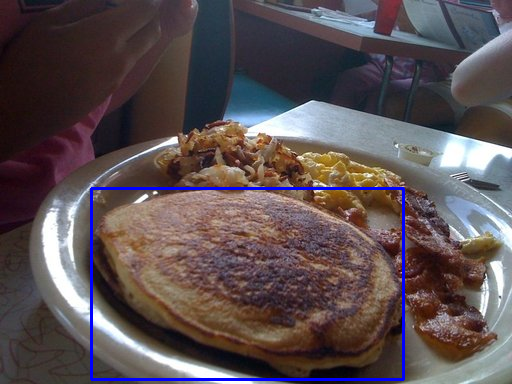

Path: 'chocolate_cake/3780966.jpg', label: 'ChocolateCake', width: '224', height: '224', bbox: [x: 9, y: 0, w:214, h:193]
Rectangle: [  9   0 214 193]


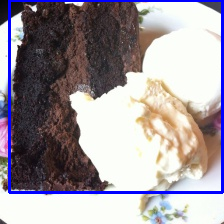

Path: 'onion_rings/199648.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 0, y: 69, w:218, h:105]
Rectangle: [  0  69 218 105]


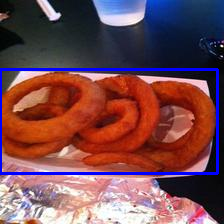

Path: 'onion_rings/93684.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 0, y: 1, w:222, h:213]
Rectangle: [  0   1 222 213]


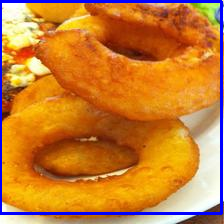

Path: 'pancakes/83414.jpg', label: 'pancakes', width: '512', height: '384', bbox: [x: 44, y: 129, w:223, h:213]
Rectangle: [ 44 129 223 213]


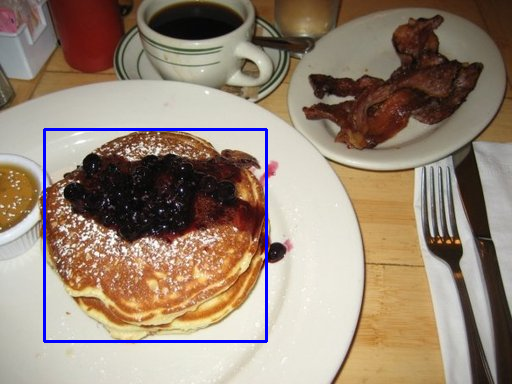

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_with_rectangle(img, np.array([[md.bbox_x, md.bbox_y, md.bbox_width, md.bbox_height]]))

Path: 'chocolate_cake/3726800.jpg', label: 'ChocolateCake', width: '224', height: '224', bbox: [x: 1, y: 5, w:223, h:214]


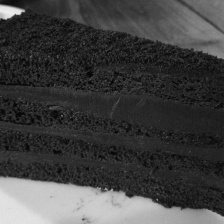

Path: 'hot_dog/1431639.jpg', label: 'hot_dog', width: '224', height: '224', bbox: [x: 58, y: 8, w:96, h:215]


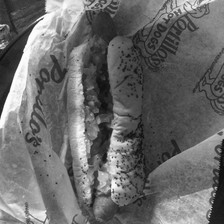

Path: 'onion_rings/598043.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 4, y: 0, w:213, h:224]


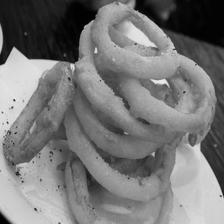

Path: 'spring_rolls/2346215.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 7, y: 11, w:198, h:191]


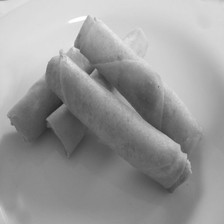

Path: 'pancakes/106087.jpg', label: 'pancakes', width: '384', height: '512', bbox: [x: 0, y: 192, w:384, h:240]


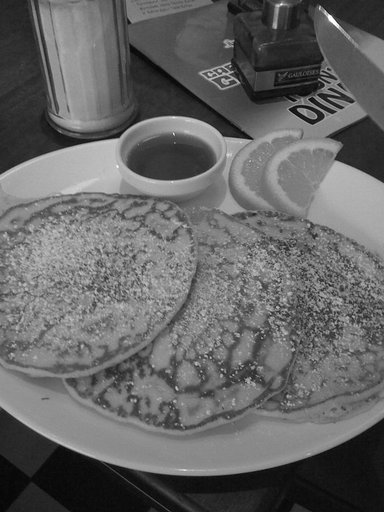

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_image_grayscale(img)

<Axes: xlabel='count'>

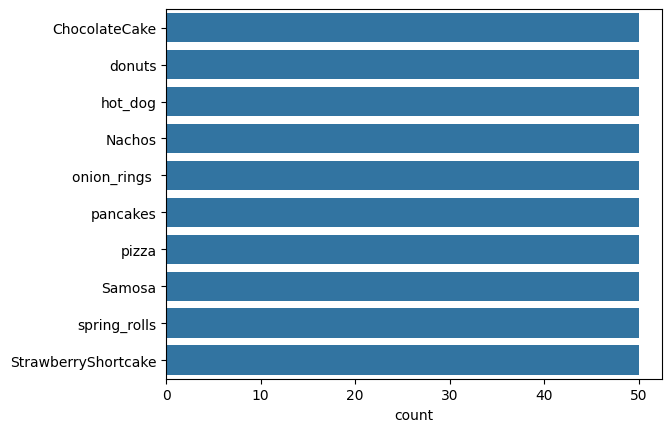

In [ ]:
sns.countplot(image_data.get_labels())

In [ ]:
image_data.resize_images()

Path: 'spring_rolls/2466847.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 31, y: 44, w:185, h:154]
Rectangle: [ 31  44 185 154]


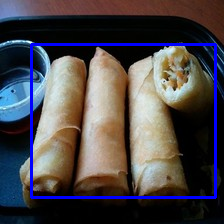

Path: 'hot_dog/51048.jpg', label: 'hot_dog', width: '224', height: '224', bbox: [x: 3, y: 7, w:221, h:215]
Rectangle: [  3   7 221 215]


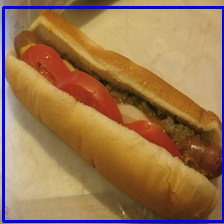

Path: 'pizza/34632.jpg', label: 'pizza', width: '224', height: '224', bbox: [x: 0, y: 41, w:224, h:182]
Rectangle: [  0  41 224 182]


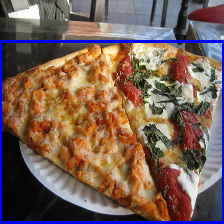

Path: 'spring_rolls/2336647.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 2, y: 92, w:156, h:130]
Rectangle: [  2  92 156 130]


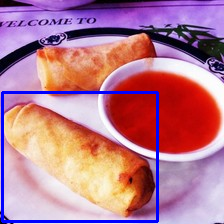

Path: 'donuts/4919.jpg', label: 'donuts', width: '224', height: '224', bbox: [x: 3, y: 35, w:213, h:189]
Rectangle: [  3  35 213 189]


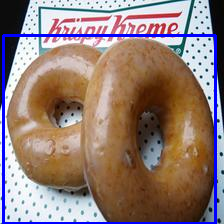

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_with_rectangle(img, np.array([[md.bbox_x, md.bbox_y, md.bbox_width, md.bbox_height]]))

In [ ]:
mask_generator = MaskGenerator()
mask_generator.create_mask_images(image_data.images_metadata)

0 - 10 - 20 - 30 - 40 - 50 - 60 - 70 - 80 - 90 - 100 - 110 - 120 - 130 - 140 - 150 - 160 - 170 - 180 - 190 - 200 - 210 - 220 - 230 - 240 - 250 - 260 - 270 - 280 - 290 - 300 - 310 - 320 - 330 - 340 - 350 - 360 - 370 - 380 - 390 - 400 - 410 - 420 - 430 - 440 - 450 - 460 - 470 - 480 - 490 - done


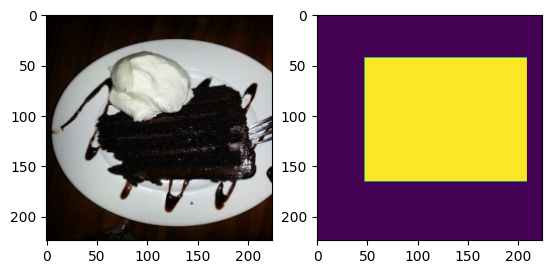

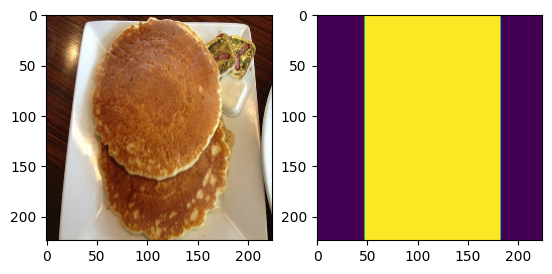

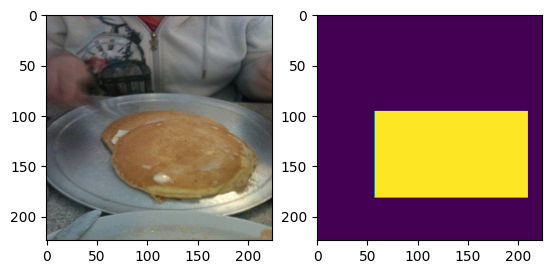

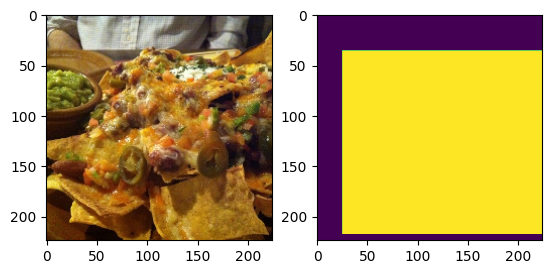

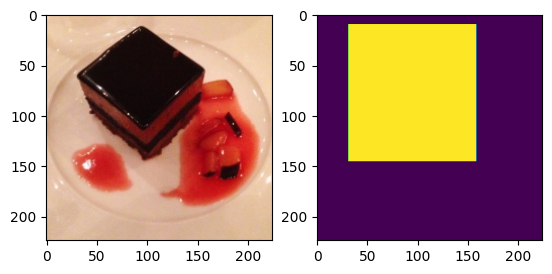

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  ImageUtils.plot_images([md.get_image(), md.get_mask_image()])

### Get the images in acceptable format

In [ ]:
X = image_data.get_unrolled_images()
mask_images = image_data.get_unrolled_mask_images()

### Encode the labels

In [ ]:
# We would use sparse categorical entropy
food_labels = image_data.get_labels()
food_le = LabelEncoder()
food_le.fit(food_labels)
classes = list(food_le.classes_)
codes = food_le.transform(list(food_le.classes_))
y = food_le.transform(food_labels)

### Check the class codes

In [ ]:
for cls, cd in zip(classes, codes):
  print("{}: {}".format(cd, cls))
FOOD_NUM_CLASSES = len(classes)

0: ChocolateCake
1: Nachos
2: Samosa
3: StrawberryShortcake
4: donuts
5: hot_dog
6: onion_rings 
7: pancakes
8: pizza
9: spring_rolls


### Check the shapes of features and labels

In [ ]:
print("Shape of X: {}".format(X.shape))
print("Shape of y: {}".format(y.shape))

Shape of X: (500, 224, 224, 3)
Shape of y: (500,)


### Split the data into Validation (10%), Test (20%) and Training (70%) datasets

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=RANDOM_SEED)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.22, random_state=RANDOM_SEED)

### Create a base model

In [ ]:
def create_model_1():
  model = models.Sequential()
  model.add(layers.Input(shape = (224, 224, 3)))
  model.add(layers.BatchNormalization())
  pool_size = 3
  initializer = initializers.RandomNormal(mean=0.0, stddev=0.05, seed=None)
  model.add(layers.Convolution2D(filters = 32, kernel_size = 3, activation ='relu', kernel_regularizer=regularizers.l2(l=0.01), kernel_initializer = initializer, bias_initializer='zeros'))
  model.add(layers.MaxPooling2D(pool_size = pool_size))
  model.add(layers.Convolution2D(filters = 40, kernel_size = 3, activation = 'relu', kernel_regularizer=regularizers.l2(l=0.01), kernel_initializer = initializer, bias_initializer='zeros'))
  model.add(layers.MaxPooling2D(pool_size = pool_size))
  model.add(layers.Flatten())
  # fully connected layer - 736/512
  model.add(layers.Dense(units = 512,activation = 'relu', kernel_initializer = initializer, bias_initializer='zeros'))
  # Classification layer
  model.add(layers.Dense(units = FOOD_NUM_CLASSES, activation = 'softmax'))
  return model

### Compile the model

In [ ]:
model_1 = create_model_1()
model_1.compile(optimizer='adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 224, 224, 3)       12        
 Normalization)                                                  
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 40)        11560     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 24, 24, 40)        0         
 g2D)                                                            
                                                        

### Fit the model with train data

In [ ]:
tr_history = model_1.fit(x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=11)

Epoch 1/11
11/11 [==============================] - 49s 4s/step - loss: 4.7049 - accuracy: 0.1054 - val_loss: 2.6134 - val_accuracy: 0.1800
Epoch 2/11
11/11 [==============================] - 25s 2s/step - loss: 2.5801 - accuracy: 0.1823 - val_loss: 2.6017 - val_accuracy: 0.1400
Epoch 3/11
11/11 [==============================] - 23s 2s/step - loss: 2.4436 - accuracy: 0.3020 - val_loss: 2.3701 - val_accuracy: 0.3200
Epoch 4/11
11/11 [==============================] - 24s 2s/step - loss: 2.2251 - accuracy: 0.3333 - val_loss: 2.2947 - val_accuracy: 0.2800
Epoch 5/11
11/11 [==============================] - 24s 2s/step - loss: 1.8724 - accuracy: 0.4957 - val_loss: 2.3409 - val_accuracy: 0.2400
Epoch 6/11
11/11 [==============================] - 25s 2s/step - loss: 1.4449 - accuracy: 0.6467 - val_loss: 2.3699 - val_accuracy: 0.3000
Epoch 7/11
11/11 [==============================] - 25s 2s/step - loss: 1.0430 - accuracy: 0.7835 - val_loss: 2.8374 - val_accuracy: 0.2600
Epoch 8/11
11/11 [==

In [ ]:
model_1.evaluate(X_test, y_test)

4/4 [==============================] - 1s 318ms/step - loss: 3.3998 - accuracy: 0.3030


[3.399811029434204, 0.3030303120613098]

In [ ]:
#model_1.save(os.path.join(MODEL_BASE_DIR, 'model_100_33_46'))

In [ ]:
#new_model = models.load_model(os.path.join(MODEL_BASE_DIR, 'model_100_40_50'))
# Show the model architecture
#new_model.summary()

In [ ]:
#new_model.evaluate(X_test, y_test)

### Checking on test data

In [ ]:
y_pred_raw = model_1.predict(X_test)
y_pred = np.argmax(y_pred_raw,axis=1)
y_pred

4/4 [==============================] - 2s 315ms/step


array([8, 4, 2, 1, 8, 8, 4, 7, 0, 7, 4, 5, 0, 3, 3, 4, 4, 4, 7, 4, 4, 1,
       9, 3, 5, 8, 4, 7, 4, 4, 6, 4, 3, 7, 4, 4, 7, 5, 7, 4, 3, 3, 4, 8,
       4, 3, 4, 4, 3, 4, 6, 4, 9, 1, 0, 1, 8, 3, 8, 4, 8, 0, 0, 8, 5, 3,
       1, 6, 0, 1, 3, 3, 4, 4, 4, 4, 5, 3, 3, 6, 7, 1, 3, 7, 3, 7, 9, 6,
       3, 6, 4, 5, 4, 8, 0, 5, 4, 3, 7])

In [ ]:
scores = ScoreUtils.get_scores(y_test,y_pred,"Test Data")
ScoreUtils.print_scores ( scores )

Scores for Test Data

Accuracy score for Test Data: 30.3
Recall score for Test Data: 30.3
Precision score for Test Data: 30.3
F1 score for Test Data: 30.3

Classification report for Test Data:
              precision    recall  f1-score   support

           0       1.00      0.50      0.67        14
           1       0.29      0.33      0.31         6
           2       0.00      0.00      0.00         9
           3       0.44      0.73      0.55        11
           4       0.17      0.50      0.26        10
           5       0.14      0.17      0.15         6
           6       0.33      0.18      0.24        11
           7       0.09      0.12      0.11         8
           8       0.40      0.27      0.32        15
           9       0.00      0.00      0.00         9

    accuracy                           0.30        99
   macro avg       0.29      0.28      0.26        99
weighted avg       0.34      0.30      0.29        99





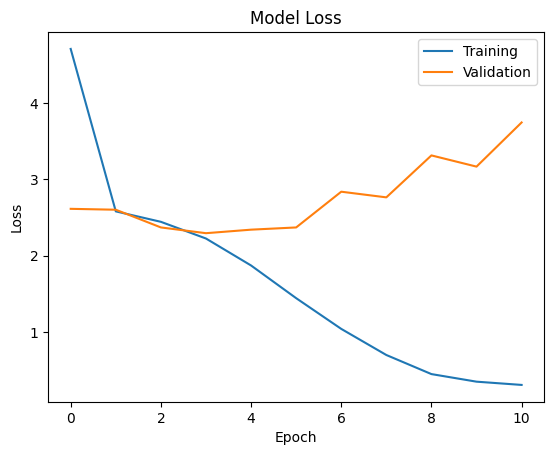

In [ ]:
ScoreUtils.plot_loss(tr_history)

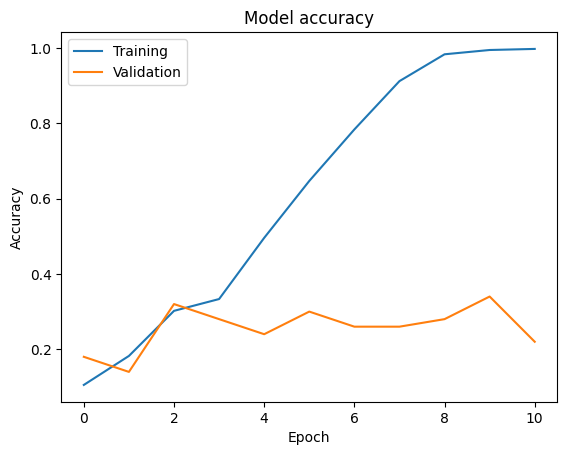

In [ ]:
ScoreUtils.plot_accuracy(tr_history)

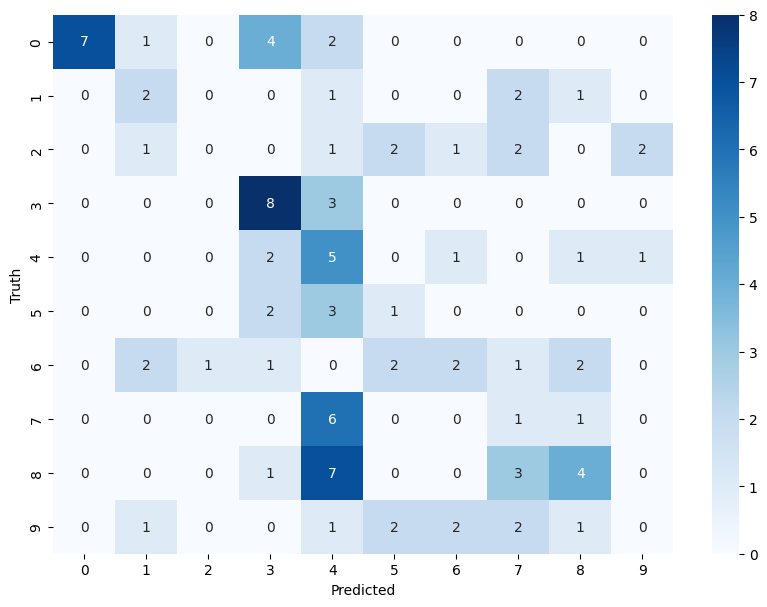

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

## Model 3 : Trained on full dataset of 17 classes

### Step 1: Import the data

In [ ]:
# Import the zip file and extract contents
"""
with zipfile.ZipFile("/content/drive/MyDrive/datasets/cs/Food_101.zip","r") as zip_ref:
    zip_ref.extractall("/content/drive/MyDrive/datasets/cs/Food_101/")
"""

'\nwith zipfile.ZipFile("/content/drive/MyDrive/datasets/cs/Food_101.zip","r") as zip_ref:\n    zip_ref.extractall("/content/drive/MyDrive/datasets/cs/Food_101/")\n'

In [ ]:
rootdir = '/content/drive/MyDrive/datasets/cs/Food_101/Food_101'
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
IMAGE_CHANNELS = 3

In [ ]:
# list all folders inside train directory
def getimagesandlabels(rootdir):

  images = []
  foods = []
  filenames = []
  labels = []

  for label in os.listdir(rootdir):
    # print(label)

    if label!= '.DS_Store':
      labels.append(label)
      classpath = os.path.join(rootdir, label)
      # imagecount = 0
      # print(label, ": ", classpath)

      for image in os.listdir(classpath):
        dummy = cv2.imread(os.path.join(classpath, image))
        filenames.append(image)
        images.append(dummy)
        foods.append(label)

        # Tested with 50 images first
        # imagecount += 1
        # if imagecount == 50:
        #   break

  return images, foods, filenames, labels

In [ ]:
images, foods, filenames, labels = getimagesandlabels(rootdir)

In [ ]:
print(len(images))
print(len(foods))
print(len(filenames))
print(len(labels))

16257
16257
16257
17


In [ ]:
print(images[9256])
print(foods[9256])
print(filenames[9256])

None
apple_pie
.DS_Store


In [ ]:
del images[9256]
del foods[9256]
del filenames[9256]

In [ ]:
# Find the distinct image sizes across all classes
shapes = []
sizes = []
for i in range(len(images)):
  size = images[i].shape
  shapes.append(str(size[0])+'X'+str(size[1])+'X'+str(size[2]))
  sizes.append(size)

In [ ]:
np.unique(shapes)

array(['188X512X3', '222X512X3', '232X512X3', '239X512X3', '241X512X3',
       '246X512X3', '253X512X3', '268X512X3', '273X512X3', '274X512X3',
       '276X512X3', '287X512X3', '288X512X3', '289X512X3', '292X512X3',
       '294X512X3', '296X512X3', '298X512X3', '300X512X3', '301X512X3',
       '303X512X3', '304X512X3', '306X512X3', '307X512X3', '308X512X3',
       '309X512X3', '310X512X3', '313X512X3', '317X512X3', '318X512X3',
       '319X512X3', '320X512X3', '322X512X3', '324X512X3', '325X512X3',
       '326X512X3', '329X512X3', '330X512X3', '332X512X3', '333X512X3',
       '334X512X3', '335X512X3', '338X512X3', '339X512X3', '340X512X3',
       '341X512X3', '342X512X3', '343X512X3', '344X512X3', '345X512X3',
       '346X512X3', '348X512X3', '351X512X3', '352X512X3', '353X512X3',
       '355X512X3', '356X512X3', '357X512X3', '358X512X3', '359X512X3',
       '360X512X3', '362X512X3', '363X512X3', '364X512X3', '365X512X3',
       '366X512X3', '367X512X3', '368X512X3', '369X512X3', '370X

In [ ]:
len(np.unique(shapes))

264

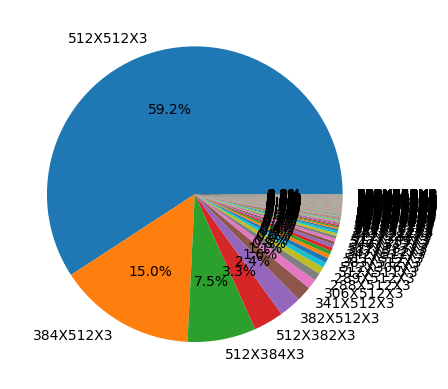

In [ ]:
shp = pd.Series(shapes).value_counts(normalize=True)
plt.pie(shp, labels=shp.index, autopct='%1.1f%%')
plt.show()

In [ ]:
shp[shp > 0.01]

512X512X3    0.592028
384X512X3    0.150160
512X384X3    0.074680
512X382X3    0.032849
382X512X3    0.024360
341X512X3    0.016486
306X512X3    0.010642
dtype: float64

In [ ]:
df = pd.DataFrame(zip(images, foods, filenames), columns=['image', 'food', 'filename' ])

In [ ]:
df['food'].value_counts()

ice_cream               1000
samosa                  1000
french_fries            1000
nachos                  1000
pizza                   1000
pancakes                1000
tacos                   1000
chocolate_cake          1000
hot_dog                 1000
spring_rolls            1000
strawberry_shortcake    1000
ravioli                 1000
falafel                 1000
waffles                 1000
donuts                  1000
onion_rings             1000
apple_pie                256
Name: food, dtype: int64

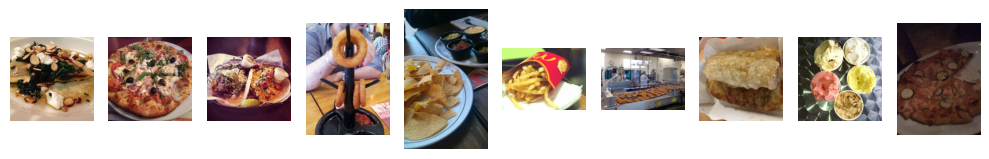

In [ ]:
integer_array = np.random.randint(0, len(images)-1, 10)
fig, ax = plt.subplots(1,10, figsize=(10,10))
for i in range(len(integer_array)) :
  image_rgb = cv2.cvtColor(images[integer_array[i]], cv2.COLOR_BGR2RGB)
  ax[i].imshow(image_rgb)
  ax[i].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def resize(images, filenames, foods):
  rimages = []
  rfilenames = []
  rfoods = []
  for i,img in enumerate(images):
      im = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      imr = cv2.resize(im, (224, 224), interpolation=cv2.INTER_CUBIC)
      rimages.append(imr)
      rfilenames.append(filenames[i])
      rfoods.append(foods[i])
  return rimages, rfilenames, rfoods

In [ ]:
rimages, rfilenames, rfoods = resize(images, filenames, foods)

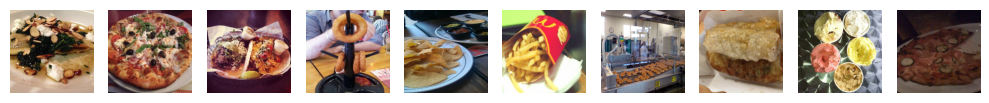

In [ ]:
fig, ax = plt.subplots(1,10, figsize=(10,10))
for i in range(len(integer_array)) :
  ax[i].imshow(rimages[integer_array[i]])
  ax[i].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
np.savez('rdata.npz', rimages=rimages, rfilenames=rfilenames, rfoods=rfoods, labels=labels)

In [ ]:
import shutil
colab_link = "/content/rdata.npz"
gdrive_link = "/content/drive/MyDrive/datasets/cs/"
shutil.copy(colab_link, gdrive_link)

'/content/drive/MyDrive/datasets/cs/rdata.npz'

#### Step 2: Map training and testing images to its classes

In [ ]:
rdata = np.load('/content/drive/MyDrive/datasets/cs/rdata.npz')
rimages = rdata['rimages']
rfilenames = rdata['rfilenames']
rfoods = rdata['rfoods']
labels = rdata['labels']

In [ ]:
rimages = np.asarray(rimages)
rfilenames = np.asarray(rfilenames)
rfoods = np.asarray(rfoods)

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(rimages, rfoods, test_size=0.3, random_state=42)

In [ ]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(11379, 224, 224, 3)
(4877, 224, 224, 3)
(11379,)
(4877,)


In [ ]:
# Normalize pixel values to be between 0 and 1
xtrnscl, xtstscl = xtrain / 255.0, xtest / 255.0

In [ ]:
le = LabelEncoder()
ytrnenc = le.fit_transform(ytrain)
ytstenc = le.transform(ytest)

In [ ]:
ytrncat = tf.keras.utils.to_categorical(ytrnenc, num_classes=17, dtype='int')
ytstcat = tf.keras.utils.to_categorical(ytstenc, num_classes=17, dtype='int')

### Building the Model : Model 3
> 3 Convolution + MaxPool layers, 1 Fully Connected Layer.
> Added Batch normalization & Dropout for Fully Connected layer to reduce overfitting
<hr>
<b>Converged with train accuracy of 78%, test accuracy of 22% </b>

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    BatchNormalization, SeparableConv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense, Conv2D, GlobalMaxPooling2D
)

In [ ]:
#instantiate the model
model4 = Sequential()
model4.add(Conv2D(32,(3,3), activation="relu", input_shape=(224,224,3)))
model4.add(MaxPooling2D((2,2)))
model4.add(BatchNormalization())

model4.add(Conv2D(64, (3,3), activation="relu"))
model4.add(MaxPooling2D((2,2)))
model4.add(BatchNormalization())

model4.add(Conv2D(128, (3,3), activation="relu"))
model4.add(MaxPooling2D((2,2)))
model4.add(BatchNormalization())

# add flatten and dense layers
#model4.add(Flatten())
model4.add(GlobalMaxPooling2D())
model4.add(Dense(256, activation="relu"))
model4.add(Dropout(0.5))
model4.add(Dense(17, activation='softmax'))

In [ ]:
model4.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 111, 111, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                        

In [ ]:
model4.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
history4 = model4.fit(xtrnscl, ytrncat, epochs=50,
                    validation_data=(xtstscl, ytstcat))

Epoch 1/50
356/356 [==============================] - 19s 39ms/step - loss: 2.8455 - accuracy: 0.1105 - val_loss: 2.7238 - val_accuracy: 0.1109
Epoch 2/50
356/356 [==============================] - 7s 18ms/step - loss: 2.5970 - accuracy: 0.1613 - val_loss: 2.5607 - val_accuracy: 0.1776
Epoch 3/50
356/356 [==============================] - 7s 19ms/step - loss: 2.5243 - accuracy: 0.1872 - val_loss: 2.5341 - val_accuracy: 0.1673
Epoch 4/50
356/356 [==============================] - 7s 18ms/step - loss: 2.4645 - accuracy: 0.2035 - val_loss: 2.3897 - val_accuracy: 0.2106
Epoch 5/50
356/356 [==============================] - 7s 18ms/step - loss: 2.4067 - accuracy: 0.2208 - val_loss: 2.3314 - val_accuracy: 0.2483
Epoch 6/50
356/356 [==============================] - 7s 19ms/step - loss: 2.3395 - accuracy: 0.2407 - val_loss: 2.2763 - val_accuracy: 0.2830
Epoch 7/50
356/356 [==============================] - 7s 18ms/step - loss: 2.2772 - accuracy: 0.2660 - val_loss: 2.2327 - val_accuracy: 0.275

In [ ]:
from numba import cuda
cuda.select_device(0) # choosing second GPU
cuda.close()

In [ ]:
# list all data in history
print(history4.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


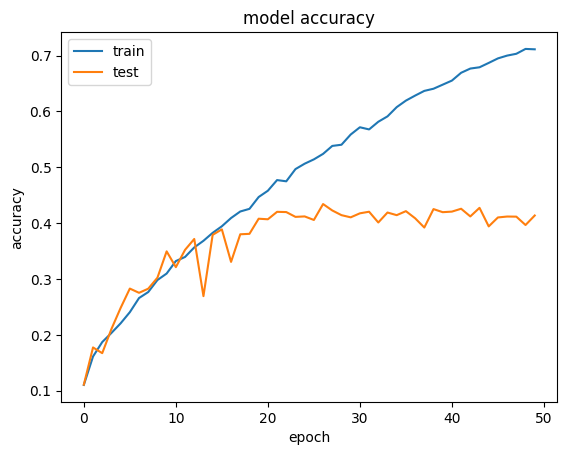

In [ ]:
# summarize history for accuracy
plt.plot(history4.history['accuracy'])
plt.plot(history4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

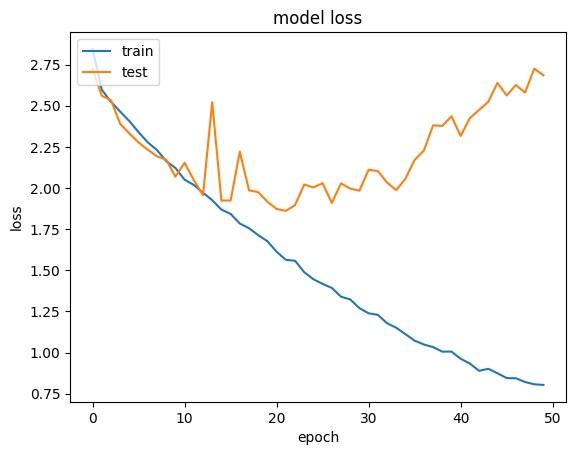

In [ ]:
# summarize history for loss
plt.plot(history4.history['loss'])
plt.plot(history4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
model4.evaluate(xtstscl, ytstcat)

153/153 [==============================] - 1s 9ms/step - loss: 2.6851 - accuracy: 0.4138


[2.6850783824920654, 0.41377896070480347]

In [ ]:
model4.evaluate(xtrnscl, ytrncat)

356/356 [==============================] - 3s 9ms/step - loss: 0.4619 - accuracy: 0.8494


[0.4618873596191406, 0.8493716716766357]

In [ ]:
# serialize model to JSON
model4_json = model4.to_json()
with open("model4.json", "w") as json_file:
    json_file.write(model4_json)
# serialize weights to HDF5
model4.save_weights("model4.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
import shutil
gdrive_link = "/content/drive/MyDrive/datasets/cs/"
model4h5 = "/content/model4.h5"
model4json = "/content/model4.json"
shutil.copy(model4h5, gdrive_link)
shutil.copy(model4json, gdrive_link)

'/content/drive/MyDrive/datasets/cs/model4.json'

### Section 3 : Load Model & Predict

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv2
import os, sys
import glob
from os import listdir
from os.path import isfile, join
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from keras.utils import to_categorical

In [ ]:
# load json and create model
json_file = open('model4.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = models.model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model4.h5")
print("Loaded model from disk")

Loaded model from disk


In [ ]:
# evaluate loaded model on test data
loaded_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
scoretst = loaded_model.evaluate(xtstscl, ytstcat, verbose=0)
scoretrn = loaded_model.evaluate(xtrnscl, ytrncat, verbose=0)

In [ ]:
print("Test %s: %.2f%%" % (loaded_model.metrics_names[1], scoretst[1]*100))
print("Train %s: %.2f%%" % (loaded_model.metrics_names[1], scoretrn[1]*100))

Test accuracy: 41.38%
Train accuracy: 84.94%


## Model 4 : Trained with TFRecord format with 17 classes

**Pre-processing the full dataset**


---



* Load Image
* Decode jpg
* resize
* pre-process input using resnet50



In [ ]:
# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3) #decode JPEG-encoded images into a tensor
    image = tf.image.resize(image, [224, 224])
    image = tf.keras.applications.resnet50.preprocess_input(image) # Channel-wise color normalization and scaling
    return image

**Incremental batch processing to prevent memory overruns**

In [ ]:
def load_and_preprocess_batch(image_paths, labels):
    # Ensure that image_paths and labels are converted to tensors
    image_paths = tf.convert_to_tensor(image_paths, dtype=tf.string)
    labels = tf.convert_to_tensor(labels, dtype=tf.float32)

    # Load and preprocess images
    images = tf.py_function(func=load_and_preprocess_image, inp=[image_paths], Tout=tf.float32)
    return images, labels

**Creating Tensor flow dataset for efficient processing**


---

* parse all jpg files and fetch appropriate labels
* transform string labels to categorical
* interleave transformation  to parallelize the data loading process.


In [ ]:
def get_sample_data(directory, sampling_rate):
    names = []
    image_paths = []
    labels = []

    for root, _, files in os.walk(directory):
        # Get the total number of images in the folder
        total_images = len([file for file in files if file.endswith('.jpg')])

        # Calculate the number of images to select based on the specified percentage
        num_images_to_select = int(total_images * sampling_rate)

        # Randomly select a subset of images
        selected_files = random.sample([file for file in files if file.endswith('.jpg')], num_images_to_select)

        for file_name in selected_files:
            names.append(file_name)

            # Assign the class name as the label
            label = os.path.basename(root)
            labels.append(label)

            # Append the file path and corresponding label
            image_paths.append(os.path.join(root, file_name))

    return names, image_paths, labels

In [ ]:
# Function to create a TensorFlow dataset
def create_dataset(directory, batch_size, sampling_rate):
  names, image_paths, labels = get_sample_data(directory, sampling_rate)
  print(len(image_paths), len(labels))

  # Convert labels to categorical
  unique_labels = list(set(labels))
  print("Unique Labels: ",unique_labels)

  label_to_index = {label: i for i, label in enumerate(unique_labels)}
  labels = [label_to_index[label] for label in labels]
  labels = to_categorical(labels, num_classes=len(unique_labels))

  # creates the base dataset. Each element of this dataset is a tuple (image_path, label)
  dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))

  # tf.expand_dims used to create the tensor of batch size 1. else there is an error for rank=0
  dataset = dataset.interleave(
      lambda x, y: tf.data.Dataset.from_tensor_slices((tf.expand_dims(x, axis=0), tf.expand_dims(y, axis=0))),
      cycle_length=tf.data.experimental.AUTOTUNE,    # number of input elements that are processed concurrently
      num_parallel_calls=tf.data.experimental.AUTOTUNE  # parallelism based on CPU resources
    )

  dataset = dataset.shuffle(buffer_size=len(image_paths), reshuffle_each_iteration=True)

  # Parallelize batch processing
  dataset = dataset.map(load_and_preprocess_batch, num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Prefetch data
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

  # Batch the dataset
  dataset = dataset.batch(batch_size)
  return dataset

In [ ]:
base_path = "/content/drive/My Drive/capstone/"
# Save the dataset to a TFRecord file
file_on_disk = os.path.join(base_path, 'dataset')

In [ ]:
# Directory where images are stored
src_folder = "food/"

# Set batch size, sampling rate based available memory
batch_size = 128
sampling_rate=0.5

# Create a dataset
load_dataset = create_dataset(os.path.join(base_path, src_folder), batch_size,sampling_rate)

# load back the tf datset
#tf.data.Dataset.save(load_dataset,file_on_disk)
#print("datafile created")

8128 8128
Unique Labels:  ['onion_rings', 'samosa', 'apple_pie', 'tacos', 'hot_dog', 'nachos', 'waffles', 'pizza', 'strawberry_shortcake', 'ice_cream', 'donuts', 'falafel', 'chocolate_cake', 'spring_rolls', 'pancakes', 'french_fries', 'ravioli']
datafile created


In [ ]:
# flush colab to write back to google drive.
drive.flush_and_unmount()

**Load the processed images dataset from disk**

In [ ]:
# Load the dataset from the TFRecord file
loaded_dataset = tf.data.Dataset.load(file_on_disk)
total_batches = len(loaded_dataset)
print(total_batches)

64


**Splitting the train and test datasets**

In [ ]:
def augment_data(image, label):
    # Apply your data augmentation techniques here
    augmented_image = tf.image.random_flip_left_right(image)
    augmented_image = tf.image.random_flip_up_down(augmented_image)
    return augmented_image, label

def augment_and_repeat(dataset):
    # Apply data augmentation to the training dataset
    dataset = dataset.map(augment_data)
    dataset = dataset.repeat()
    return dataset

In [ ]:
# Split the dataset into training and test sets
train_size = int(0.8 * len(loaded_dataset))
train_dataset = loaded_dataset.take(train_size)
test_dataset = loaded_dataset.skip(train_size)

print(train_size)
print(len(train_dataset))
print(len(test_dataset))

# Shuffle and prefetch the training dataset
train_dataset = train_dataset.shuffle(buffer_size=2000)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)


51
51
13


In [ ]:
# Split the training dataset into training and validation sets
split_train_size = int(0.7 * len(train_dataset))
split_train_dataset = train_dataset.take(split_train_size)
split_val_dataset = train_dataset.skip(split_train_size)

steps_per_epoch = len(split_train_dataset)
validation_steps = len(split_val_dataset)

# Augment and repeat the training dataset
split_train_dataset = augment_and_repeat(split_train_dataset)

**CNN Model**

In [ ]:
def cnn_model(input_shape, num_classes, loss='categorical_crossentropy', metrics=['accuracy']):
  model = Sequential()

  model.add(Conv2D(32, 3, padding='same', activation='relu', input_shape=input_shape))
  model.add(MaxPool2D(pool_size=(2, 2)))
  model.add(BatchNormalization())

  model.add(Conv2D(64, 3, padding='same', activation='relu'))
  model.add(MaxPool2D(pool_size=(2, 2)))
  model.add(BatchNormalization())

  model.add(Conv2D(128, 3, padding='same', activation='relu'))
  model.add(MaxPool2D(pool_size=(2, 2)))
  model.add(BatchNormalization())

  model.add(GlobalMaxPool2D())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(64, activation='relu'))
  model.add(Dense(32, activation='relu'))
  model.add(Dense(num_classes, activation="softmax"))

  optimizer = Adam()
  model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
  model.summary()
  return model

**Initialize the model**

In [ ]:
from keras import backend as K
K.clear_session()

in_shape = (224, 224, 3)
cnn = cnn_model(in_shape,17)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 112, 112, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                        

**Train the model**

In [ ]:
early_stopping = EarlyStopping(monitor='val_accuracy',patience=3,restore_best_weights=True)
epochs = 50
cnn_history = cnn.fit(split_train_dataset,
                      epochs=epochs,
                       steps_per_epoch=steps_per_epoch,
                      validation_data=split_val_dataset,
                      validation_steps=validation_steps,
                      callbacks=[early_stopping])

Epoch 1/50
35/35 [==============================] - 89s 2s/step - loss: 3.1228 - accuracy: 0.0739 - val_loss: 3.0587 - val_accuracy: 0.0728
Epoch 2/50
35/35 [==============================] - 54s 2s/step - loss: 2.7906 - accuracy: 0.0993 - val_loss: 2.8216 - val_accuracy: 0.1230
Epoch 3/50
35/35 [==============================] - 53s 2s/step - loss: 2.7321 - accuracy: 0.1254 - val_loss: 2.7413 - val_accuracy: 0.1079
Epoch 4/50
35/35 [==============================] - 52s 2s/step - loss: 2.6672 - accuracy: 0.1654 - val_loss: 2.7255 - val_accuracy: 0.1162
Epoch 5/50
35/35 [==============================] - 50s 1s/step - loss: 2.5932 - accuracy: 0.1855 - val_loss: 2.6209 - val_accuracy: 0.1636
Epoch 6/50
35/35 [==============================] - 48s 1s/step - loss: 2.5173 - accuracy: 0.2004 - val_loss: 2.5302 - val_accuracy: 0.2012
Epoch 7/50
35/35 [==============================] - 48s 1s/step - loss: 2.4162 - accuracy: 0.2241 - val_loss: 2.4482 - val_accuracy: 0.2334
Epoch 8/50
35/35 [==

In [ ]:
df_cnn_history = pd.DataFrame(cnn_history.history)
df_cnn_history.head()

,loss,accuracy,val_loss,val_accuracy
0,3.122842,0.073884,3.058662,0.072754
1,2.790585,0.099330,2.821564,0.123047
2,2.732070,0.125446,2.741325,0.107910
3,2.667234,0.165402,2.725470,0.116211
4,2.593176,0.185491,2.620852,0.163574


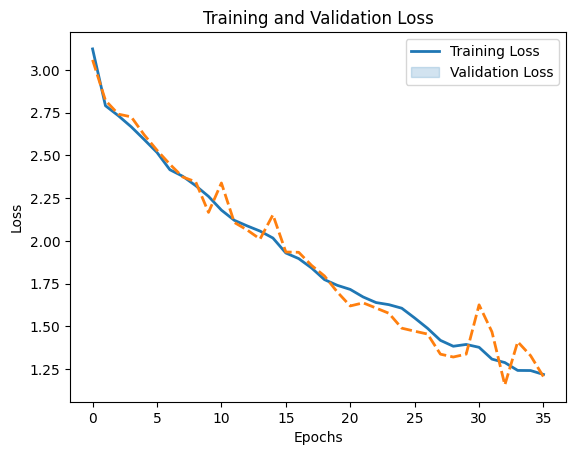

In [ ]:
sns.lineplot(data=df_cnn_history[['loss', 'val_loss']], linewidth=2);
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend(labels=['Training Loss', 'Validation Loss'])

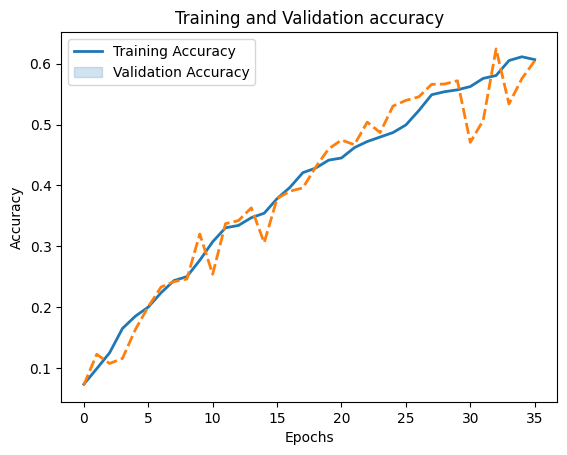

In [ ]:
sns.lineplot(data=df_cnn_history[['accuracy', 'val_accuracy']], linewidth=2);
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation accuracy')
plt.legend(labels=['Training Accuracy', 'Validation Accuracy'])

In [ ]:
cnn_loss, cnn_acc = cnn.evaluate(train_dataset, verbose=0)
print('Train Accuracy: %.3f%%' % (cnn_acc*100))
print('Train Loss: %.3f'% cnn_loss)

Train Accuracy: 63.006%
Train Loss: 1.163



In [ ]:
cnn_loss_t, cnn_acc_t = cnn.evaluate(test_dataset, verbose=0)
print('Test Accuracy: %.3f%%' % (cnn_acc_t*100))
print('Test Loss: %.3f'% cnn_loss_t)
print()

Test Accuracy: 43.875%
Test Loss: 1.888



In [ ]:
# Function to get true and predicted labels
def get_true_and_pred_labels(model, dataset, steps):
    true_labels = []
    pred_labels = []

    for batch in dataset.take(steps):
        images, labels = batch
        predictions = model.predict(images)

        true_labels.extend(np.argmax(labels, axis=1))
        pred_labels.extend(np.argmax(predictions, axis=1))

    return true_labels, pred_labels

In [ ]:
# Get true and predicted labels
true_labels, pred_labels = get_true_and_pred_labels(cnn, train_dataset, validation_steps)

4/4 [==============================] - 0s 19ms/step


Confusion Matrix:


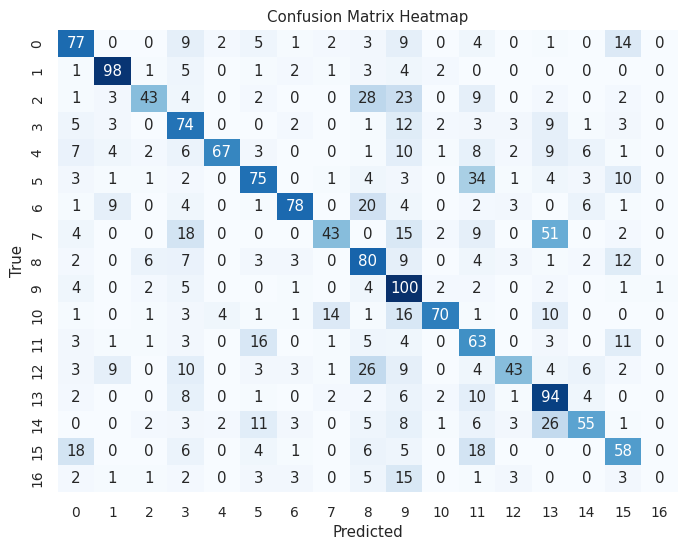

In [ ]:
cm = confusion_matrix(true_labels, pred_labels)
print("Confusion Matrix:")
plt.figure(figsize=(8, 6))
sns.set(font_scale=.9)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False);
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Heatmap')
plt.show()

2/2 [==============================] - 0s 16ms/step
Confusion Matrix (Test):


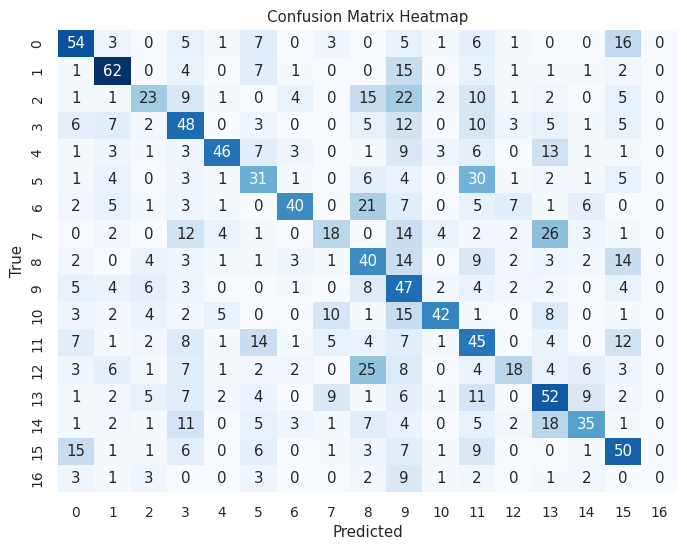

In [ ]:
# Get true and predicted labels for the test dataset
true_labels_test, pred_labels_test = get_true_and_pred_labels(cnn, test_dataset, 13)

# Calculate confusion matrix for the test dataset
confusion_mat_test = confusion_matrix(true_labels_test, pred_labels_test)
print("Confusion Matrix (Test):")
plt.figure(figsize=(8, 6))
sns.set(font_scale=.9)
sns.heatmap(confusion_mat_test, annot=True, fmt='g', cmap='Blues', cbar=False);
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Heatmap')
plt.show()

# **Milestone 2 : Hybrid RCNN (Model 6)**

## Imports

---



In [ ]:
# general libraries
import warnings
import random
import pandas as pd
import numpy as np
import zipfile
import os
import shutil
from google.colab import drive, files
from PIL import Image
from io import BytesIO

# visualization support
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# sci-kit learn
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
import cv2

from keras import backend as K
from keras.applications import ResNet50
from keras.applications.vgg16 import VGG16
from keras.layers import Dense,Input, Dropout, InputLayer, BatchNormalization, Flatten, GlobalAveragePooling2D, Conv2D, MaxPool2D, GlobalMaxPool2D, Concatenate
from keras.models import Sequential, Model
from keras.optimizers import Adam, RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger
from keras.metrics import categorical_accuracy,categorical_crossentropy, IoU

tf.random.set_seed(18)

## Google drive mounting

In [ ]:
def mount_gdrive():
  drive.mount('/content/drive/',force_remount=True)

def flush_n_reload_gdrive():
  drive.flush_and_unmount()
  mount_gdrive()

In [ ]:
mount_gdrive()

Mounted at /content/drive/


## Display bounding boxes (sample set)

---



In [ ]:
def display_image_with_bbox(ax, img_name, image_np, box_x, box_y, box_width, box_height):
    ax.imshow(image_np)
    rect = patches.Rectangle((box_x, box_y), box_width, box_height, linewidth=1,fill=False, edgecolor='b')
    ax.add_patch(rect)
    ax.set_title(img_name)
    ax.axis('off')

def print_bounding_boxes(num_boxes):
    fig, axes = plt.subplots((num_boxes + 4) // 5, 5, figsize=(10, 2*((num_boxes + 4) // 5)))
    for i, ax_row in enumerate(axes):
        for j, ax in enumerate(ax_row):
            index = i * 5 + j
            if index < num_boxes:
                annotation = annotations[index]
                box_x, box_y, box_width, box_height = annotation
                image = X[index]
                img_name = image_names[index]
                display_image_with_bbox(ax, img_name, image, box_x, box_y, box_width, box_height)
            else:
                ax.axis('off')
    plt.tight_layout()
    plt.show()

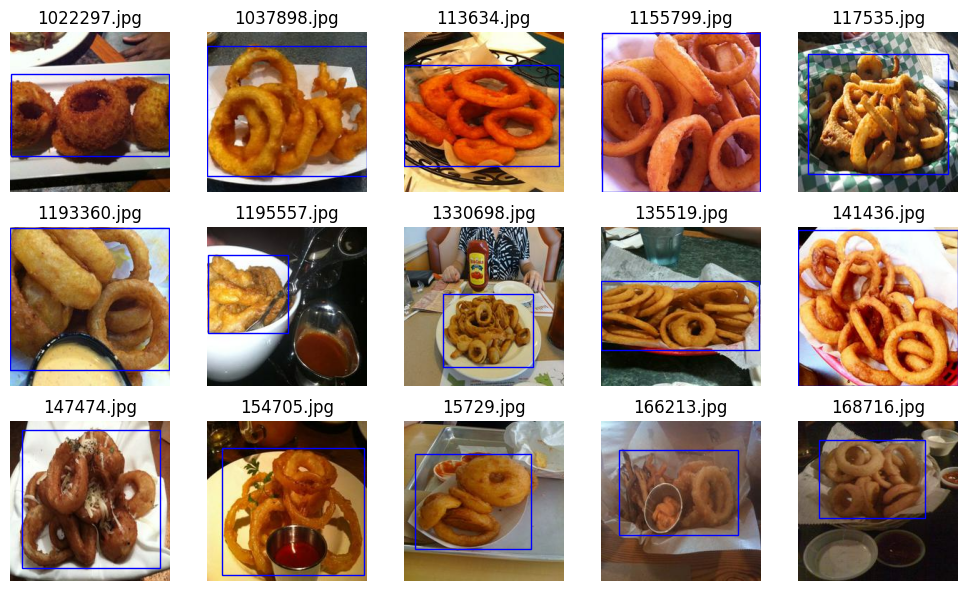

In [ ]:
print_bounding_boxes(15)

## Data Preparation

---

*create a npy file with images (224x224), class labels and bounding box annotations*

In [ ]:
def preprocess_image(image_data,pre=True):
    image = tf.image.decode_jpeg(image_data, channels=3)
    if pre==True:
      image = tf.keras.applications.resnet50.preprocess_input(image)
    image_array = np.array(image)
    return image_array

In [ ]:
def process_zip(zip_file_path, output_path, pre=True):
    image_data = []
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
      folder_names = set(os.path.dirname(file_info.filename) for file_info in zip_ref.infolist())
      for folder_name in folder_names:
          csv_file_name = os.path.join(folder_name, f"{folder_name}.csv")
          if csv_file_name in zip_ref.namelist():
              annotation_data = zip_ref.read(csv_file_name)
              annotations = pd.read_csv(BytesIO(annotation_data), usecols=range(1,6) , header=0)

              for file_info in zip_ref.infolist():
                  current_folder = os.path.dirname(file_info.filename)
                  if current_folder == folder_name and file_info.filename.endswith('.jpg'):
                      img=file_info.filename.split("/")[1]
                      ann = annotations[annotations['image_name']==img].iloc[:,:4].values[0]
                      image_data.append({
                        "image_name": img,
                        "label" : folder_name,
                        "image" : preprocess_image(zip_ref.read(file_info),pre),
                        "annotation": ann
                      })

    out_file = "output_data_raw.npy" if pre == False else "output_data.npy"
    npy_file_path = os.path.join(output_path, out_file)
    np.save(npy_file_path, image_data)

In [ ]:
zip_file_path = "/content/drive/My Drive/capstone/resize10.zip"
output_folder = "/content/drive/My Drive/capstone/npz10"
process_zip(zip_file_path, output_folder,False)

## Create X,y

---
*Load saved npy file to create X,y for split_train_test. encode categorical variables*


In [ ]:
# load the npy and create X,y
file_path = os.path.join(output_folder, "output_data_raw.npy")
data = np.load(file_path,allow_pickle=True)
X_data = []
labels = []
annotations = []
image_names = []
for image_data in data:
  image_names.append(image_data['image_name'])
  labels.append(image_data['label'])
  X_data.append(image_data['image'])
  annotations.append(image_data['annotation'])

# Create X variable by stacking the array
X = np.stack(X_data, axis=0)
labels = np.stack(labels, axis=0)
annotations = np.stack(annotations, axis=0)

print(X.shape)
print(labels.shape)
print(annotations.shape)

(400, 224, 224, 3)
(400,)
(400, 4)


In [ ]:
num_classes = 8

# Convert class names to categorical values
encoder = LabelEncoder()
y_enc = encoder.fit_transform(labels)
print(np.unique(y_enc))

# Save the mapping of categorical values to original values
label_mapping = dict(zip(range(len(encoder.classes_)), encoder.classes_))
print(label_mapping)

[0 1 2 3 4 5 6 7]
{0: 'chocolate_cake', 1: 'donuts', 2: 'hot_dog', 3: 'nachos', 4: 'onion_rings', 5: 'samosa', 6: 'spring_rolls', 7: 'strawberry_shortcake'}


## Hybrid RCNN

---

*used a custom classification and bounding box regression heads with a pre-trained model on Resnet50*

##### *Preparing dataset for train, test, val*

In [ ]:
y = to_categorical(y_enc, num_classes=num_classes)

# print shapes
print(y.shape)

# Save the mapping of categorical values to original values
label_mapping = dict(zip(range(len(encoder.classes_)), encoder.classes_))
print(label_mapping)

# Split the data into train, test, and validation sets
X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size=0.3,stratify=y, random_state=18)
X_train1, X_val, y_train1, y_val  = train_test_split(X_train, y_train, test_size=0.4,stratify=y_train, random_state=18)

# Split Annotations
Ann_train, Ann_test = train_test_split(annotations, test_size=0.3, stratify=y, random_state=18)
Ann_train1, Ann_val = train_test_split(Ann_train, test_size=0.4, stratify=y_train, random_state=18)

print("Train\t",X_train1.shape, y_train1.shape,Ann_train1.shape )
print("Val\t", X_val.shape, y_val.shape,Ann_val.shape)
print("Test\t",X_test.shape, y_test.shape, Ann_test.shape)

(400, 8)
{0: 'chocolate_cake', 1: 'donuts', 2: 'hot_dog', 3: 'nachos', 4: 'onion_rings', 5: 'samosa', 6: 'spring_rolls', 7: 'strawberry_shortcake'}
Train	 (168, 224, 224, 3) (168, 8) (168, 4)
Val	 (112, 224, 224, 3) (112, 8) (112, 4)
Test	 (120, 224, 224, 3) (120, 8) (120, 4)


##### *Model definition*

In [ ]:
input_shape = (224, 224, 3)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze convolutional layers
for layer in base_model.layers:
    layer.trainable = False

# Add classification and regression heads
x = base_model.output
x = Conv2D(256, (3, 3), activation='relu')(x)
x = Flatten()(x)
class_output = Dense(8, activation='softmax', name="class")(x)
bbox_output = Dense(4, activation='linear', name="bbox")(x)

model = Model(inputs=base_model.input, outputs=[class_output, bbox_output])
model.compile(optimizer='adam', loss=['categorical_crossentropy', 'mse'], metrics=['accuracy'])
model.summary()

# Train the model
history = model.fit(X_train1, [y_train1, Ann_train1], validation_data=(X_val, [y_val,Ann_val]),epochs=10, batch_size=32)

history_df = pd.DataFrame(history.history)

94765736/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                         

##### *Display the model metrics*

In [ ]:
history_df.head(15)

,loss,class_loss,bbox_loss,class_accuracy,bbox_accuracy,val_loss,val_class_loss,val_bbox_loss,val_class_accuracy,val_bbox_accuracy
0,15267.539062,36.708294,15230.830078,0.154762,0.541667,7293.937500,69.323532,7224.613281,0.125000,0.607143
1,4892.927734,90.356110,4802.571289,0.130952,0.672619,5108.906250,48.649944,5060.256348,0.160714,0.616071
2,2341.356201,37.324966,2304.031250,0.172619,0.791667,3371.509277,26.840868,3344.668457,0.125000,0.696429
3,1651.264160,28.392122,1622.872070,0.220238,0.833333,2823.216064,24.105581,2799.110107,0.232143,0.660714
4,1279.799561,15.337638,1264.461914,0.327381,0.833333,2920.805176,15.127854,2905.677490,0.312500,0.678571
5,739.246216,11.399770,727.846497,0.386905,0.779762,2971.404053,10.880362,2960.523682,0.294643,0.741071
6,452.433502,5.485424,446.948059,0.517857,0.880952,2945.482910,8.919110,2936.563721,0.366071,0.741071
7,310.591644,4.803749,305.787903,0.565476,0.886905,2873.640381,7.017959,2866.622559,0.401786,0.696429
8,192.388916,1.570662,190.818237,0.750000,0.928571,2716.823975,5.733497,2711.090332,0.437500,0.750000
9,132.320465,1.392340,130.928101,0.732143,0.922619,2709.250000,4.743478,2704.506592,0.500000,0.714286


##### *Model evaluation*

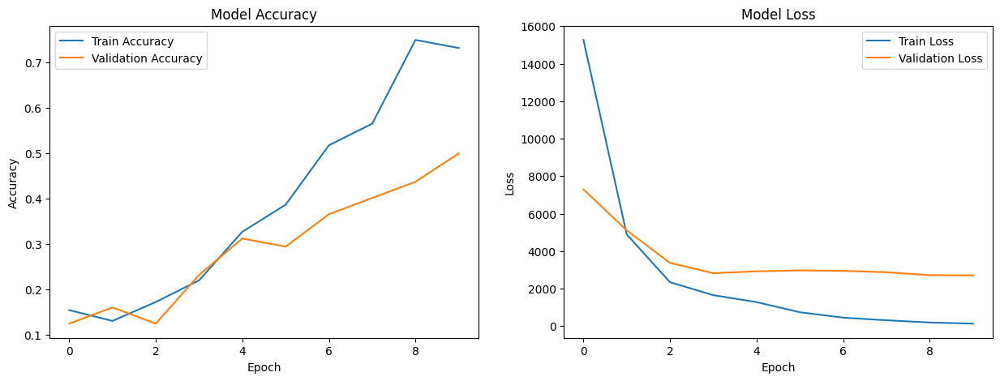

Training Classification Accuracy: 0.7321428656578064 


4/4 [==============================] - 30s 7s/step - loss: 2919.3015 - class_loss: 5.7783 - bbox_loss: 2913.5234 - class_accuracy: 0.5083 - bbox_accuracy: 0.7750
Test Loss: 2919.301513671875
Test Classification Accuracy: 0.5083333253860474
Test Classification Loss: 5.778315544128418


Test Bounding Box Loss: 2913.5234375
Test Bounding Box Accuracy: 0.7749999761581421


In [ ]:
# Plot loss vs accuracy across epochs for training and validation sets
plt.figure(figsize=(15, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history_df['class_accuracy'], label='Train Accuracy')
plt.plot(history_df['val_class_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_df['loss'], label='Train Loss')
plt.plot(history_df['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


final_training_accuracy = history.history['class_accuracy'][-1]
print("Training Classification Accuracy:", final_training_accuracy,"\n\n")


# Evaluate the model on the test set
test_loss, test_class_loss, test_bbox_loss, test_class_accuracy, test_bbox_accuracy = model.evaluate(X_test, [y_test, Ann_test])
# Print evaluation results
print("Test Loss:", test_loss)
print("Test Classification Accuracy:", test_class_accuracy)
print("Test Classification Loss:", test_class_loss)

print("\n\nTest Bounding Box Loss:", test_bbox_loss)
print("Test Bounding Box Accuracy:", test_bbox_accuracy)

##### *Evaluation on test data*

In [ ]:
# Make predictions on the test dataset
predictions = model.predict(X_test)

In [ ]:
predicted_labels = np.argmax(predictions[0], axis=1)

[0 1 2 3 4 5 6 7]


Confusion Matrix:


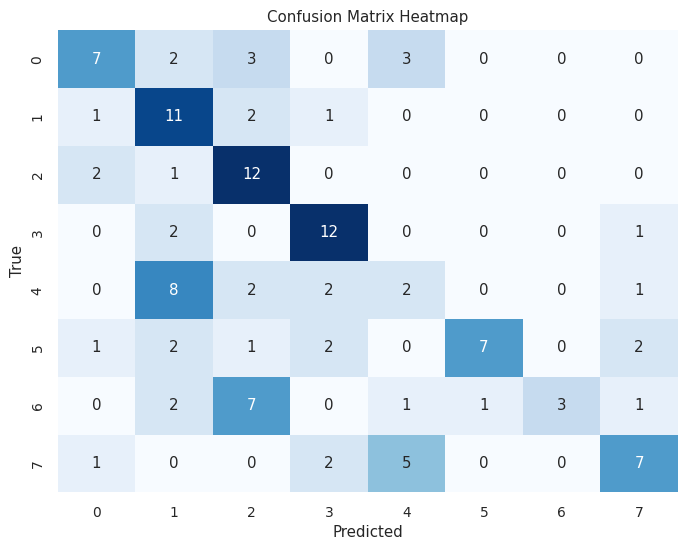

In [ ]:
from sklearn.metrics import classification_report

true_labels = np.argmax(y_test, axis=1)
true_class_names = [label_mapping[label] for label in true_labels]
predicted_class_names = [label_mapping[label] for label in predicted_labels]


cm = confusion_matrix(true_labels, predicted_labels)
cm_df = pd.DataFrame(cm, index=label_mapping, columns=label_mapping)
print("Confusion Matrix:")
plt.figure(figsize=(8, 6))
sns.set(font_scale=.9)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False);
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [ ]:
true_class_names = [label_mapping[label] for label in true_labels]
predicted_class_names = [label_mapping[label] for label in predicted_labels]
report = classification_report(true_class_names, predicted_class_names, output_dict=True)
df_report = pd.DataFrame(report)
df_report.T

,precision,recall,f1-score,support
chocolate_cake,0.583333,0.466667,0.518519,15.000000
donuts,0.392857,0.733333,0.511628,15.000000
hot_dog,0.444444,0.800000,0.571429,15.000000
nachos,0.631579,0.800000,0.705882,15.000000
onion_rings,0.181818,0.133333,0.153846,15.000000
samosa,0.875000,0.466667,0.608696,15.000000
spring_rolls,1.000000,0.200000,0.333333,15.000000
strawberry_shortcake,0.583333,0.466667,0.518519,15.000000
accuracy,0.508333,0.508333,0.508333,0.508333
macro avg,0.586546,0.508333,0.490231,120.000000


##### *Prediction*

In [ ]:
def perform_prediction(img, actual_ann, actual_class):
    test_image = cv2.resize(img, (224, 224))
    classification_probs, bbox_coords = model.predict(np.expand_dims(test_image, axis=0))

    # Get the predicted class label with the highest probability
    predicted_class_index = np.argmax(classification_probs)
    predicted_class_prob = classification_probs[0][predicted_class_index]

    # Get the predicted bounding box coordinates
    predicted_bbox_coords = bbox_coords[0]
    actual_bbox_coords = actual_ann

    x_actual, y_actual, w_actual, h_actual = actual_bbox_coords
    cv2.rectangle(img, (x_actual, y_actual), (x_actual + w_actual, y_actual + h_actual), (0, 0, 255), 2)

    # Draw bounding box on the test image
    x, y, w, h = predicted_bbox_coords
    x, y, w, h = int(x), int(y), int(w), int(h)
    print(x, y, w, h)
    cv2.rectangle(test_image, (x, y), (x + w, y + h), (255,0, 0), 1)

    # Display predicted class label and probability
    class_label = label_mapping[predicted_class_index]
    lbl = actual_class
    print("Predicted Class : " , class_label, "\t Actual : ", label_mapping[lbl])
    #cv2.putText(test_image, f'{class_label}: {predicted_class_prob:.2f}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)

    # Display the test image with classification and bounding box
    plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

1/1 [==============================] - 0s 360ms/step
22 14 265 247
Predicted Class :  samosa 	 Actual :  samosa


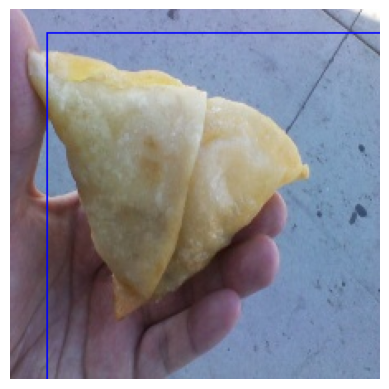

In [ ]:
img = cv2.imread('/content/drive/My Drive/capstone/Annotated/Samosa/126682.jpg')
actual_ann = np.array([11,22,170,152])
actual_class = 5
perform_prediction(img, actual_ann, actual_class)

1/1 [==============================] - 0s 354ms/step
3 19 284 261
Predicted Class :  donuts 	 Actual :  donuts


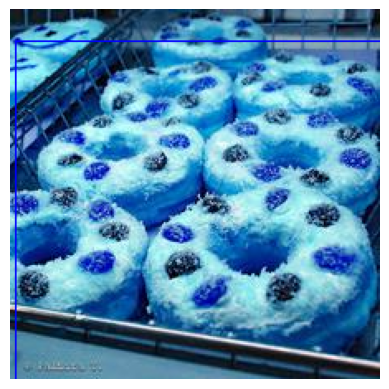

In [ ]:
idx = 11
img = X_test[idx]
actual_ann = Ann_test[idx]
actual_class = np.argmax(y_test[idx])
perform_prediction(img, actual_ann, actual_class)

In [ ]:
import pickle
# Save the Keras model using pickle
with open("/content/drive/My Drive/rcnn/hybridrcnn_model.pkl", "wb") as f:
    pickle.dump(model, f)

# **Milestone 2 : Mask RCNN (Model 7)**

## Import basic libraries

In [ ]:
import os
import sys
import time
from datetime import datetime
import pathlib
import random
from zipfile import ZipFile
import numpy as np
import pandas as pd
import h5py
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from google.colab import drive

## sklearn

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn import svm
from sklearn import metrics

## Deep learning libraries

In [ ]:
import tensorflow
import keras
from keras import layers, models, optimizers, losses, regularizers, initializers
from keras.applications import mobilenet
!pip install keras-tuner -q
import keras_tuner

## Computer Vision

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

## Random seed initialization

In [ ]:
RANDOM_SEED = 10
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tensorflow.random.set_seed(RANDOM_SEED)
keras.utils.set_random_seed(RANDOM_SEED)

## Mount google drive

In [ ]:
drive.mount('/content/drive')
PROJECT_BASE_PATH = '/content/drive/MyDrive/Workspace/GreatLearning/AIML/11 Capstone/Shared'
MODEL_BASE_DIR = os.path.join(PROJECT_BASE_PATH, "models")
if not os.path.exists(MODEL_BASE_DIR):
  os.makedirs(MODEL_BASE_DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Some utilities

In [ ]:
class PerfUtils(object):
  '''Some memory utilities
  '''
  timers = {}

  @staticmethod
  def start(timer_name):
    # alternate time.time()
    PerfUtils.timers[timer_name] = datetime.now()

  @staticmethod
  def elapsed(timer_name):
    time_elapsed = datetime.now() - PerfUtils.timers[timer_name]
    return time_elapsed

  @staticmethod
  def print_elapsed(timer_name):
    time_elapsed = PerfUtils.elapsed(timer_name)
    print('[{}] time elapsed {} (hh:mm:ss.ms)'.format(timer_name, time_elapsed))

  @staticmethod
  def format_size(num, suffix='B'):
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
      if abs(num) < 1024.0:
         return "%3.1f %s%s" % (num, unit, suffix)
      num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

  @staticmethod
  def print_memory_usage(l_items):
    l_items_info = ((name, sys.getsizeof(value)) for name, value in l_items)
    l_items_sorted = sorted(l_items_info, key= lambda x: -x[1])
    l_items_top = l_items_sorted[:10]
    for name, size in l_items_top:
      print("{:>30}: {:>8}".format(name, PerfUtils.format_size(size)))

In [ ]:
class ScoreUtils(object):
  '''Utility class for scoring
  '''

  @staticmethod
  def get_scores ( actual_data, pred_data, data_name ) :
    '''Get score from given actual_data and predicted_data'''
    a_score = round(metrics.accuracy_score(actual_data,pred_data)*100,2)
    r_score = round(metrics.recall_score(actual_data,pred_data,average='micro')*100,2)
    p_score = round(metrics.precision_score(actual_data,pred_data,average='micro')*100,2)
    f1_score = round(metrics.f1_score(actual_data,pred_data,average='micro')*100,2)
    cr = metrics.classification_report(actual_data, pred_data)
    return ( a_score, r_score, p_score, f1_score, cr, data_name )

  @staticmethod
  def print_scores ( s ) :
    '''Print the given score'''
    ( a_score, r_score, p_score, f1_score, cr, data_name ) = s
    print ( "Scores for {}\n".format(data_name) )
    print ( "Accuracy score for {}: {}".format(data_name, a_score))
    print ( "Recall score for {}: {}".format(data_name, r_score))
    print ( "Precision score for {}: {}".format(data_name, p_score))
    print ( "F1 score for {}: {}".format(data_name, f1_score))
    print ( "\nClassification report for {}:\n{}\n\n".format(data_name, cr))

  @staticmethod
  def scores_to_dataframe ( s ) :
    '''Convert the score tuple into a pandas DataFrame'''
    ( a_score, r_score, p_score, f1_score, cr, data_name ) = s
    myscoredf = pd.DataFrame ( s[0:4], columns = ['Score'], index = ['Accuracy', 'Recall', 'Precision', 'F1'] )
    return myscoredf

  @staticmethod
  def scores_difference ( score_base, score_new, data_name='' ) :
    '''Compute difference between two given scores'''
    df_score_base = ScoreUtils.scores_to_dataframe(score_base)
    df_score_new = ScoreUtils.scores_to_dataframe(score_new)
    tmp = df_score_new - df_score_base
    print ( "Difference in performance {}:\n{}".format(data_name,tmp) )
    return tmp

  @staticmethod
  def plot_loss (h_) :
    plt.plot(h_.history['loss'])
    plt.plot(h_.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='best')
    plt.show()

  @staticmethod
  def plot_accuracy (h_) :
    plt.plot(h_.history['accuracy'])
    plt.plot(h_.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='best')
    plt.show()

In [ ]:
class ImageUtils(object):
  '''Utility methods around images
  '''
  @staticmethod
  def print_image_info (image):
    print("Image dimension: {} x {}, channels: {}".format(image.shape[0],image.shape[1],image.shape[2]))

  @staticmethod
  def plot_image(img, label=""):
    plt.suptitle(label)
    plt.imshow(img)
    plt.show()

  @staticmethod
  def plot_image_grayscale(img, label=""):
    cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

  @staticmethod
  def plot_image_pair(img1, img2):
    '''Plot 2 images side by side'''
    plt.subplot(121)
    plt.imshow(img1)
    plt.subplot(122)
    plt.imshow(img2)
    plt.show()

  @staticmethod
  def plot_images(images):
    '''Plot images side by side'''
    num = len(images)
    for i in range(0, num):
      plt.subplot(1,num,i+1)
      plt.imshow(images[i])
    plt.show()

  @staticmethod
  def image_num_channels(image) :
    '''image ndarray of shape (height,width,channels)'''
    if(image.ndim == 2):
      return 1
    elif(image.ndim == 3):
      return image.shape[2]
    else:
      assert 0

  @staticmethod
  def resize_image(image, new_dim):
    '''Resize a given image to given dimensions
    image - The image to resize, ndarray(height,width,channels)
    new_dim - tuple of (new_width, new_height)'''
    new_width = new_dim[0]
    new_height = new_dim[1]
    return cv2.resize(image, dsize=(new_width, new_height), interpolation=cv2.INTER_CUBIC)

  @staticmethod
  def resize_images(images, new_dim, fix_channels):
    '''Resize the given images'''
    images_resized = np.empty(images.shape[0],dtype=object)
    for i in range(0, images.shape[0]) :
      #print("Resizing image: ", i)
      resized_image = ImageUtils.resize_image(images[i], new_dim)
      if (fix_channels) :
        if(ImageUtils.image_num_channels(resized_image) == 1):
          # Black and white image
          resized_image = cv2.merge((resized_image,resized_image,resized_image))
        if(ImageUtils.image_num_channels(resized_image) == 4):
          resized_image = cv2.cvtColor(resized_image, cv2.COLOR_RGBA2RGB)
      images_resized[i] = resized_image
    return images_resized

  @staticmethod
  def unroll_images(images, dim):
    '''Unroll images to be used in model
    '''
    unrolled_images = np.empty(dim, dtype = np.uint8)
    for i in range(0,images.shape[0]):
      unrolled_images[i] = images[i]
    return unrolled_images

  @staticmethod
  def rectangle(image, rect):
    img = np.copy(image)
    for rect in rect:
      print("Rectangle: {}".format(rect))
      cv2.rectangle(img, rect, (0, 0, 255), 2)
    return img

  @staticmethod
  def plot_with_rectangle(img, rects):
    '''rect np.array([[10,5,20,30], [10,5,20,30]], np.int32)
    '''
    assert rects.ndim == 2
    if len(rects) :
      tmp_img = ImageUtils.rectangle(img, rects)
      cv2_imshow(cv2.cvtColor(tmp_img, cv2.COLOR_RGB2BGR))
    else:
      cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
      print("No face identified in the image")

In [ ]:
# For testing when we want to run on small set of images. 0 means no limit.
FOOD_ITEM_IMAGE_LIMIT = 0

class ZipUtils(object):
  '''A utility class for managing zip file
  '''

  def __init__(self, file_path):
    self.file_path = file_path
    self.zip_file = ZipFile(self.file_path, 'r')
    self.infolist = self.zip_file.infolist()

  def scan_files(self):
    '''Generate a list of files/directories in the zip file
    '''
    self.directory_count = 0
    self.file_extensions = { }
    directories = [ ]
    files = [ ]
    i = 0
    for info in self.infolist :
      if(info.is_dir()):
        directories.append(info.filename)
      else:
        ext = os.path.splitext(info.filename)
        if not ext in self.file_extensions.keys() :
          self.file_extensions[ext] = 0
        self.file_extensions[ext] += 1
        files.append(info.filename)
        i += 1
        if ( i == FOOD_ITEM_IMAGE_LIMIT ):
          break
    self.directories = np.array(directories)
    self.files = np.array(files)
    print("Total directories: {}, files: {}".format(self.num_directories(), self.num_files()))

  def file_bytes(self, file_path):
    '''Get the bytes for a given file
    '''
    return self.zip_file.read(file_path)

  def num_files(self):
    '''Total number of files
    '''
    return self.files.shape[0]

  def num_directories(self):
    '''Total number of directories
    '''
    return self.directories.shape[0]

In [ ]:
class ImageMetadata(object):
  '''Class to encapsulate image metadata
  '''

  def __init__(self, image_path, label, width, height, bbox_x, bbox_y, bbox_width, bbox_height):
    self.image_path = image_path
    self.image_file_name = os.path.basename(self.image_path)
    self.image_dir = os.path.basename(self.image_path)
    self.label = label
    self.width = width
    self.height = height
    self.bbox_x = bbox_x
    self.bbox_y = bbox_y
    self.bbox_width = bbox_width
    self.bbox_height = bbox_height
    # Lazy loaded later when load_from_zip is called
    self.image_data = None
    self.mask_image_data = None

  def load_from_zip(self, zip_utils):
    '''Load the file from zip file
    '''
    if self.image_data is None:
      image_bytes = zip_utils.file_bytes(self.image_path)
      self.image_data = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)
      self.image_data = cv2.cvtColor(self.image_data, cv2.COLOR_BGR2RGB)

  def get_image(self):
    '''Get image data.
    NOTE: Since we load image only when required, load_from_zip needs to be called before calling get_image
    '''
    assert not (self.image_data is None)
    return self.image_data

  def get_mask_image(self):
    '''Get mask image data.
    '''
    assert not (self.mask_image_data is None)
    return self.mask_image_data

  def release_image(self):
    self.image_data = None

  def resize_image(self, new_dim):
    '''Resize image to given dimensions
    new_dim - tuple of (new_width, new_height)'''
    new_width = new_dim[0]
    new_height = new_dim[1]
    assert not (self.image_data is None)
    self.image_data = ImageUtils.resize_image(self.image_data, new_dim)
    self.bbox_x = int(self.bbox_x * (float(new_width) / (self.width) ))
    self.bbox_width = int(self.bbox_width * (float(new_width) / (self.width) ))
    self.bbox_y = int(self.bbox_y * (float(new_height) / (self.height)))
    self.bbox_height = int(self.bbox_height * (float(new_height) / (self.height)))
    self.width = new_width
    self.height = new_height

  def print(self):
    print(str(self))

  def __str__(self):
    return "Path: '{}', label: '{}', width: '{}', height: '{}', bbox: [x: {}, y: {}, w:{}, h:{}]".format(self.image_path, self.label, self.width, self.height, self.bbox_x, self.bbox_y, self.bbox_width, self.bbox_height)

In [ ]:
class MaskGenerator(object):

  def get_mask_coordinates_scaled(self, info):
    '''From the image info, extract the cordinates of rectangle containing face'''
    w = info['imageWidth']
    h = info['imageHeight']
    start_x, start_y, end_x, end_y = info['points'][0]['x']*w, info['points'][0]['y']*h, info['points'][1]['x']*w, info['points'][1]['y']*h
    return int(start_x), int(start_y), int(end_x), int(end_y)

  def fill_mask_image(self, mask_image, image_md):
    '''In a given empty image, mark 1 for mask of face using the given info
    image_md ImageMetadata
    '''
    height = mask_image.shape[0]
    width = mask_image.shape[1]
    start_x, start_y, end_x, end_y = image_md.bbox_x, image_md.bbox_y, image_md.bbox_x + image_md.bbox_width, image_md.bbox_y + image_md.bbox_height
    #print("Creating mask: {} < x < {}, {} < y < {}".format(start_x, end_x, start_y, end_y))
    mask_image[start_y:end_y,start_x:end_x] = 1
    return mask_image

  def create_mask_image(self, image_md):
    '''Create a mask image for given ImageMetadata'''
    #print_image_info(image)
    mask_image = np.zeros((image_md.height,image_md.width),dtype=np.uint8)
    # If multiple bbox, then use following
    #for info in info_list :
    self.fill_mask_image(mask_image, image_md)
    return mask_image

  def create_mask_images(self, images_md):
    '''Create mask images for given list of images
    images_md ndarray of ImageMetadata'''
    mask_images = np.empty((images_md.shape[0]),dtype=object)
    for i in range(0,images_md.shape[0]):
      images_md[i].mask_image_data = self.create_mask_image(images_md[i])
      print(i, end=" - ") if i%10 == 0 else 0
    print("done")

In [ ]:
class ImageData(object):
  '''Class to extract/load images archive
  '''

  MODEL_IMAGE_WIDTH = 224
  MODEL_IMAGE_HEIGHT = 224

  def __init__(self, images_zip_path, images_labels_csv):
    self.images_zip_path = images_zip_path
    self.images_labels_csv = images_labels_csv
    assert os.path.exists(self.images_zip_path)
    self.zip_utils = ZipUtils(self.images_zip_path)
    self.annotations = pd.read_csv(self.images_labels_csv)
    self.labels_map = {}

  def create_image_metadata(self, image_file_path):
    '''Create metadata for given image
    '''
    image_name = os.path.basename(image_file_path)
    row = self.annotations.loc[self.annotations['image_name']==image_name]
    width = row['image_width'].iloc[0]
    height = row['image_height'].iloc[0]
    bbox_x = row['bbox_x'].iloc[0]
    bbox_y = row['bbox_y'].iloc[0]
    bbox_width = row['bbox_width'].iloc[0]
    bbox_height = row['bbox_height'].iloc[0]
    label = row['label_name'].iloc[0]
    md = ImageMetadata(image_file_path, label, width, height, bbox_x, bbox_y, bbox_width, bbox_height)
    return md

  def create_metadata(self):
    '''Create a metadata array for all image files
    '''
    self.zip_utils.scan_files()
    count = self.zip_utils.files.shape[0]
    self.images_metadata = np.empty((count), dtype=object)
    for i in range(0, count):
      image_file_path = self.zip_utils.files[i]
      md = self.create_image_metadata(image_file_path)
      self.images_metadata[i] = md
      self.labels_map[md.label] = self.labels_map[md.label] + 1 if md.label in self.labels_map.keys() else 1
    print("Created metadata for {} images".format(count))
    print("Total {} unique labels: {}".format(len(self.labels_map), self.labels_map))

  def load_images(self):
    for i in self.images_metadata:
      i.load_from_zip(self.zip_utils)

  def resize_images(self):
    new_size = (ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH)
    for i in self.images_metadata:
      i.resize_image(new_size)

  def __get_unrolled_images(self, images, dim):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    count = len(images)
    unrolled_images = np.empty(dim, dtype = np.uint8)
    for i in range(0,count):
      unrolled_images[i] = images[i]
    return unrolled_images

  def get_unrolled_images(self):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    images = [md.get_image() for md in self.images_metadata]
    count = len(images)
    dim = (count, ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH, 3)
    return self.__get_unrolled_images(images, dim)

  def get_unrolled_mask_images(self):
    '''Get image data in ndarray of dim (n, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    '''
    mask_images = [md.get_mask_image() for md in self.images_metadata]
    count = len(mask_images)
    dim = (count, ImageData.MODEL_IMAGE_HEIGHT, ImageData.MODEL_IMAGE_WIDTH)
    return self.__get_unrolled_images(mask_images, dim)

  def get_labels(self):
    return np.array([md.label for md in self.images_metadata])

  def get_metadata_image(self, md):
    '''Get image for given metadata
    '''
    md.load_from_zip(self.zip_utils)
    return md.get_image()

  def get_image(self, idx):
    md = self.images_metadata[idx]
    return self.get_metadata_image(md)

  def release_image(self, idx):
    '''To conserve memory, we would release images once our job is done
    '''
    md = self.images_metadata[idx]
    md.release_image()

  def release_all_images(self):
    '''To conserve memory, we would release images once our job is done
    '''
    for md in self.images_metadata:
      md.release_image()

## Load the images ZIP and annotations CSV

In [ ]:
images_zip = os.path.join ( PROJECT_BASE_PATH, "Food101/images_500.zip")
annotations_csv = os.path.join ( PROJECT_BASE_PATH, "Food101/labels_500.csv" )
image_data = ImageData(images_zip, annotations_csv)

## Create metadata

In [ ]:
image_data.create_metadata()
image_data.load_images()

Total directories: 0, files: 500
Created metadata for 500 images
Total 10 unique labels: {'ChocolateCake': 50, 'donuts': 50, 'hot_dog': 50, 'Nachos': 50, 'onion_rings ': 50, 'pancakes': 50, 'pizza': 50, 'Samosa': 50, 'spring_rolls': 50, 'StrawberryShortcake': 50}


## Display some random images

Path: 'pancakes/75444.jpg', label: 'pancakes', width: '512', height: '384', bbox: [x: 91, y: 188, w:313, h:192]
Rectangle: [ 91 188 313 192]


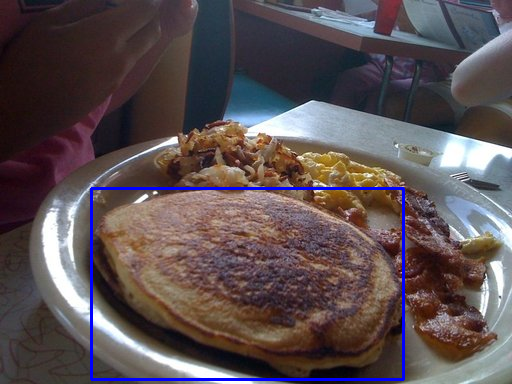

Path: 'chocolate_cake/3780966.jpg', label: 'ChocolateCake', width: '224', height: '224', bbox: [x: 9, y: 0, w:214, h:193]
Rectangle: [  9   0 214 193]


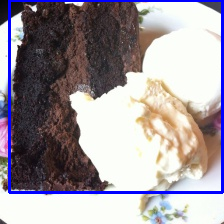

Path: 'onion_rings/199648.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 0, y: 69, w:218, h:105]
Rectangle: [  0  69 218 105]


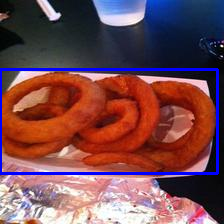

Path: 'onion_rings/93684.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 0, y: 1, w:222, h:213]
Rectangle: [  0   1 222 213]


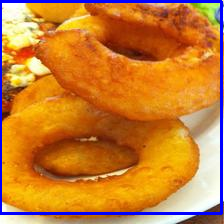

Path: 'pancakes/83414.jpg', label: 'pancakes', width: '512', height: '384', bbox: [x: 44, y: 129, w:223, h:213]
Rectangle: [ 44 129 223 213]


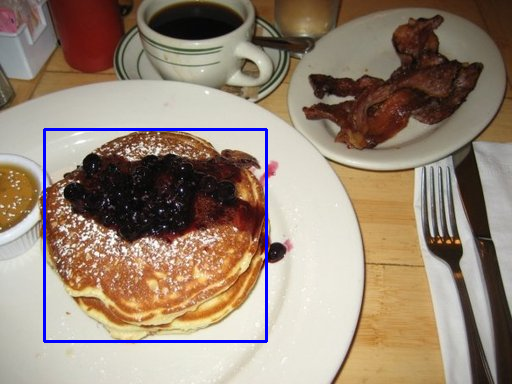

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_with_rectangle(img, np.array([[md.bbox_x, md.bbox_y, md.bbox_width, md.bbox_height]]))

Path: 'chocolate_cake/3726800.jpg', label: 'ChocolateCake', width: '224', height: '224', bbox: [x: 1, y: 5, w:223, h:214]


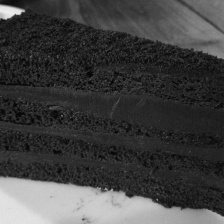

Path: 'hot_dog/1431639.jpg', label: 'hot_dog', width: '224', height: '224', bbox: [x: 58, y: 8, w:96, h:215]


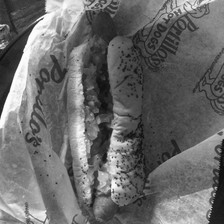

Path: 'onion_rings/598043.jpg', label: 'onion_rings ', width: '224', height: '224', bbox: [x: 4, y: 0, w:213, h:224]


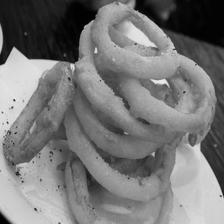

Path: 'spring_rolls/2346215.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 7, y: 11, w:198, h:191]


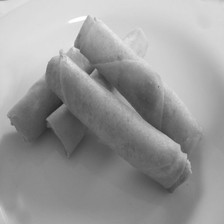

Path: 'pancakes/106087.jpg', label: 'pancakes', width: '384', height: '512', bbox: [x: 0, y: 192, w:384, h:240]


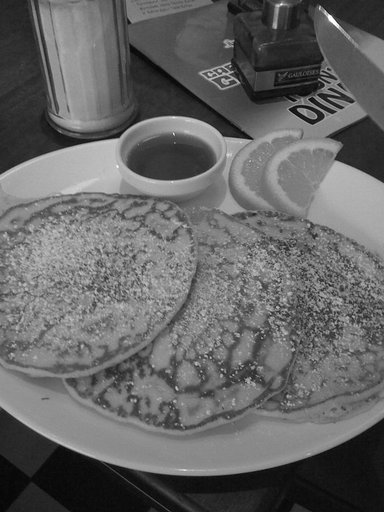

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_image_grayscale(img)

<Axes: xlabel='count'>

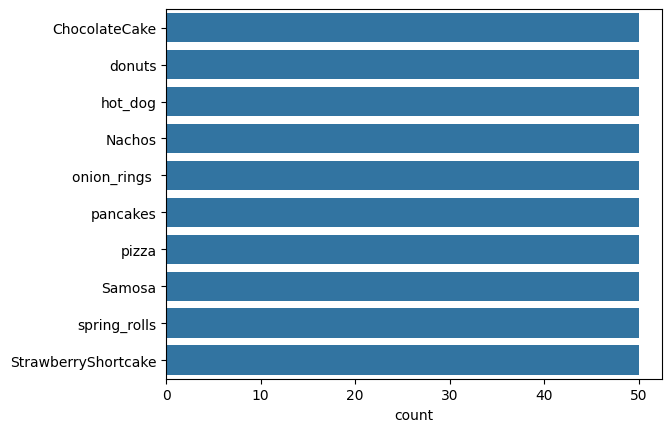

In [ ]:
sns.countplot(image_data.get_labels())

In [ ]:
image_data.resize_images()

Path: 'spring_rolls/2466847.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 31, y: 44, w:185, h:154]
Rectangle: [ 31  44 185 154]


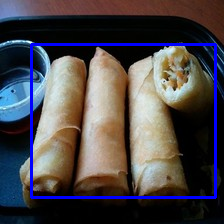

Path: 'hot_dog/51048.jpg', label: 'hot_dog', width: '224', height: '224', bbox: [x: 3, y: 7, w:221, h:215]
Rectangle: [  3   7 221 215]


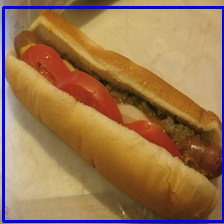

Path: 'pizza/34632.jpg', label: 'pizza', width: '224', height: '224', bbox: [x: 0, y: 41, w:224, h:182]
Rectangle: [  0  41 224 182]


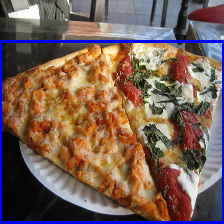

Path: 'spring_rolls/2336647.jpg', label: 'spring_rolls', width: '224', height: '224', bbox: [x: 2, y: 92, w:156, h:130]
Rectangle: [  2  92 156 130]


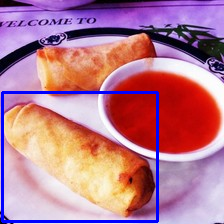

Path: 'donuts/4919.jpg', label: 'donuts', width: '224', height: '224', bbox: [x: 3, y: 35, w:213, h:189]
Rectangle: [  3  35 213 189]


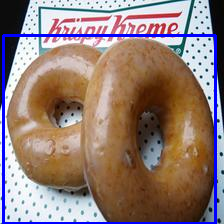

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  img = md.get_image()
  print(md)
  ImageUtils.plot_with_rectangle(img, np.array([[md.bbox_x, md.bbox_y, md.bbox_width, md.bbox_height]]))

In [ ]:
mask_generator = MaskGenerator()
mask_generator.create_mask_images(image_data.images_metadata)

0 - 10 - 20 - 30 - 40 - 50 - 60 - 70 - 80 - 90 - 100 - 110 - 120 - 130 - 140 - 150 - 160 - 170 - 180 - 190 - 200 - 210 - 220 - 230 - 240 - 250 - 260 - 270 - 280 - 290 - 300 - 310 - 320 - 330 - 340 - 350 - 360 - 370 - 380 - 390 - 400 - 410 - 420 - 430 - 440 - 450 - 460 - 470 - 480 - 490 - done


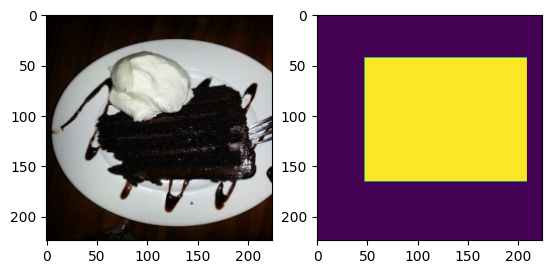

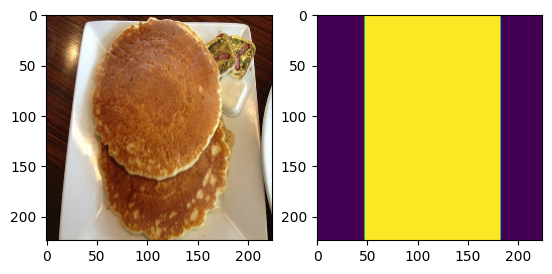

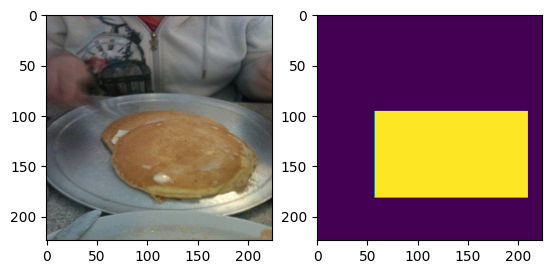

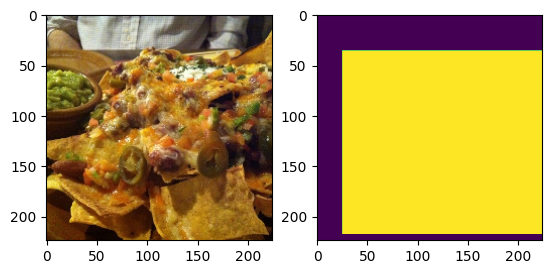

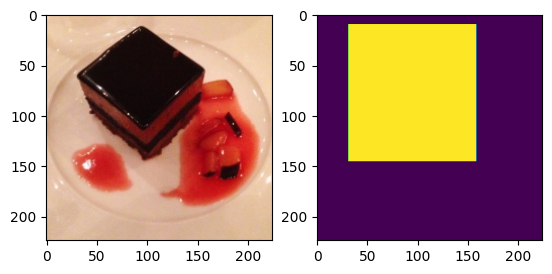

In [ ]:
for j in range(0,5):
  i = random.randint(0, len(image_data.images_metadata)-1)
  md = image_data.images_metadata[i]
  ImageUtils.plot_images([md.get_image(), md.get_mask_image()])

## Prepare Train/Test data

## Get the images in acceptable format

In [ ]:
X = image_data.get_unrolled_images()
mask_images = image_data.get_unrolled_mask_images()

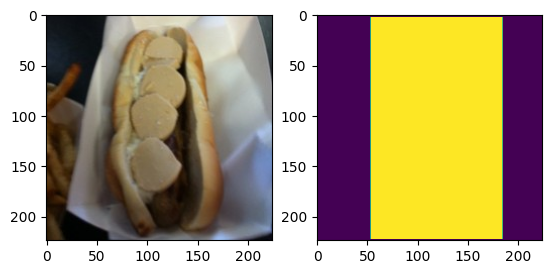

In [ ]:
ImageUtils.plot_images([X[100], mask_images[100]])

## Encode the labels

In [ ]:
# We would use sparse categorical entropy
food_labels = image_data.get_labels()
food_le = LabelEncoder()
food_le.fit(food_labels)
classes = list(food_le.classes_)
codes = food_le.transform(list(food_le.classes_))
y = food_le.transform(food_labels)

## Check the class codes

In [ ]:
for cls, cd in zip(classes, codes):
  print("{}: {}".format(cd, cls))
FOOD_NUM_CLASSES = len(classes)

0: ChocolateCake
1: Nachos
2: Samosa
3: StrawberryShortcake
4: donuts
5: hot_dog
6: onion_rings 
7: pancakes
8: pizza
9: spring_rolls


## Check the shapes of features and labels

In [ ]:
print("Shape of X: {}".format(X.shape))
print("Shape of y: {}".format(y.shape))

Shape of X: (500, 224, 224, 3)
Shape of y: (500,)


## Object Detection using RCNN

## Some Utility Classes

In [ ]:
class SegmentationUtils(object):
  '''Utility class for functions related to image segmentation
  '''

  @staticmethod
  def prediction_to_mask(pred):
    '''Convert a mask prediction probability to mask
    Taking mask bits with probability greater than 0.5
    '''
    # Taking probability > 0.5
    pred_mask = 1.0*(pred > 0.5)
    return pred_mask

  @staticmethod
  def predictions_to_mask(pred_list):
    '''Convert a list of predicted mask probabilities to masks
    '''
    pred_mask_list = np.empty(pred_list.shape, dtype=np.uint8)
    for i in range(0, pred_list.shape[0]):
      pred_mask_list[i] = SegmentationUtils.prediction_to_mask(pred_list[i])
    return pred_mask_list

  @staticmethod
  def mask_image(image, mask):
    '''Mask an image with given mask
    image: 3 channel image
    mask: mask to apply (dtype=uint8)
    '''
    image2 = np.copy(image)
    image2[:,:,0] = mask*image[:,:,0]
    image2[:,:,1] = mask*image[:,:,1]
    image2[:,:,2] = mask*image[:,:,2]
    return image2

  @staticmethod
  def mask_all_images(images, masks):
    '''Mask the given images with given masks and return the masked images
    '''
    masked_images = np.empty(images.shape, images.dtype)
    for i in range(0, images.shape[0]):
      masked_images[i] = SegmentationUtils.mask_image(images[i], masks[i])
    return masked_images

  @staticmethod
  def iou_score(target, prediction):
    '''Generate IOU(intersection over union) score
    '''
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

  @staticmethod
  def jscore(target, prediction):
    '''Generate jaccard score
    '''
    jac = jaccard_score(target, prediction, average='micro')
    return jac

  @staticmethod
  def generate_iou_scores(masks, pred_masks):
    '''Generate IOU (intersection over union) scores for a list of masks/predicted masks
    '''
    iou_scores = np.empty(masks.shape[0], dtype=np.float32)
    for i in range(0, masks.shape[0]):
      iou_scores[i] = SegmentationUtils.iou_score(masks[i], pred_masks[i])
    return iou_scores

  @staticmethod
  def generate_jaccard_scores(masks, pred_masks):
    '''Generate jaccard scores for a list of masks/predicted masks
    '''
    jscores = np.empty(masks.shape[0], dtype=np.float32)
    for i in range(0, masks.shape[0]):
      jscores[i] = SegmentationUtils.jscore(masks[i], pred_masks[i])
    return jscores

### Test/Train split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, mask_images, test_size=0.2, random_state=RANDOM_SEED)

### Display some random masks

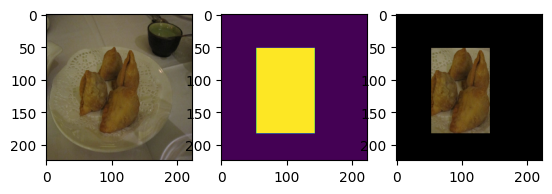

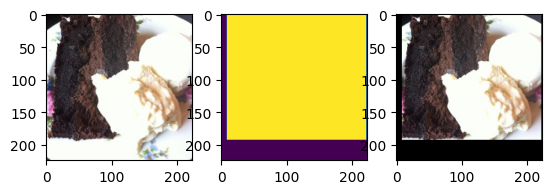

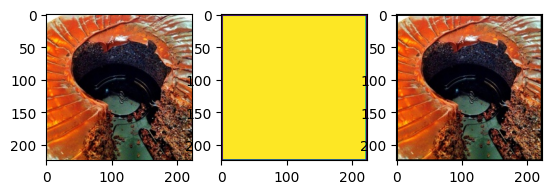

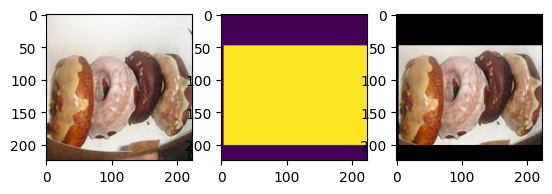

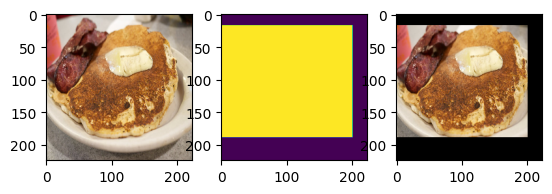

In [ ]:
for i in range(0, 5):
  ri = random.randint(0, X_train.shape[0])
  masked_image = SegmentationUtils.mask_image(X_train[ri], y_train[ri])
  ImageUtils.plot_images([X_train[ri], y_train[ri], masked_image])

### Design a object detection model.

We will use MobileNet architecture for initial layers and add upsampling layers to imitate U-net architecture.

In [ ]:
def create_model(trainable=True):
    model = mobilenet.MobileNet(input_shape=(224, 224, 3), include_top=False, alpha=1, weights="imagenet")

    for layer in model.layers:
        layer.trainable = trainable

    block_input = model.layers[0].output # 224 x 224
    block1 = model.get_layer("conv_pw_1_relu").output # 112 x 112
    block3 = model.get_layer("conv_pw_3_relu").output # 56 x 56
    block5 = model.get_layer("conv_pw_5_relu").output # 28 x 28
    block11 = model.get_layer("conv_pw_11_relu").output # 14 x 14
    block13 = model.get_layer("conv_pw_13_relu").output

    # Add upsampling layers
    cx = layers.Concatenate()([layers.UpSampling2D()(block13), block11])
    cx = layers.Concatenate()([layers.UpSampling2D()(cx), block5])
    cx = layers.Concatenate()([layers.UpSampling2D()(cx), block3])
    cx = layers.Concatenate()([layers.UpSampling2D()(cx), block1])
    cx = layers.Concatenate()([layers.UpSampling2D()(cx), block_input])

    x = layers.Conv2D(1, kernel_size=1, activation="sigmoid")(cx)
    x = layers.Reshape((224,224))(x)

    return models.Model(inputs=model.input, outputs=x)

### Define Dice coefficient and Loss function

In [ ]:
def dice_coefficient(y_true, y_pred):
    numerator = 2 * tensorflow.reduce_sum(y_true * y_pred)
    denominator = tensorflow.reduce_sum(y_true + y_pred)
    return numerator / (denominator + tensorflow.keras.backend.epsilon())

def loss(y_true, y_pred):
    return losses.binary_crossentropy(y_true, y_pred) - tensorflow.keras.backend.log(dice_coefficient(y_true, y_pred) + tensorflow.keras.backend.epsilon())

### Build the Model

In [ ]:
model = create_model(False)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)         128       ['conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['conv1_bn[0][0]']      

### Compile the Model

In [ ]:
model.compile(loss=loss, optimizer="Adam", metrics=[dice_coefficient])

### Preprocess the image data

In [ ]:
def preprocess_image_data(data):
  return mobilenet.preprocess_input(np.array(data,dtype=np.float32))

X_train_preprocessed = preprocess_image_data(X_train)
X_test_preprocessed = preprocess_image_data(X_test)
y_train_preprocessed = np.array(y_train,dtype=np.float32)
y_test_preprocessed = np.array(y_test,dtype=np.float32)

### Train the Model

In [ ]:
# This step takes large amount of time and memory
# Sometimes errors out with: Your session crashed after using all available RAM. If you are interested in access to high-RAM runtimes, you may want to check out Colab Pro.

PerfUtils.start("Model fit")
model.fit(X_train_preprocessed, y_train_preprocessed, epochs=5, batch_size=4, verbose=1)
PerfUtils.print_elapsed("Model fit")

Epoch 1/5
100/100 [==============================] - 469s 5s/step - loss: 0.8176 - dice_coefficient: 0.7789
Epoch 2/5
100/100 [==============================] - 432s 4s/step - loss: 0.6274 - dice_coefficient: 0.8226
Epoch 3/5
100/100 [==============================] - 447s 4s/step - loss: 0.5673 - dice_coefficient: 0.8343
Epoch 4/5
100/100 [==============================] - 449s 4s/step - loss: 0.5329 - dice_coefficient: 0.8408
Epoch 5/5
100/100 [==============================] - 449s 4s/step - loss: 0.5172 - dice_coefficient: 0.8431
[Model fit] time elapsed 0:37:25.843866 (hh:mm:ss.ms)


In [ ]:
PerfUtils.print_memory_usage(locals().items())

          X_train_preprocessed: 229.7 MiB
          y_train_preprocessed: 76.6 MiB
                             X: 71.8 MiB
                       X_train: 57.4 MiB
           X_test_preprocessed: 57.4 MiB
                   mask_images: 23.9 MiB
                       y_train: 19.1 MiB
           y_test_preprocessed: 19.1 MiB
                        X_test: 14.4 MiB
                        y_test:  4.8 MiB


In [ ]:
model.save_weights(os.path.join(MODEL_BASE_DIR, 'RCNN_Mobilenet_Hybrid_1_Weights'))

In [ ]:
model.load_weights(os.path.join(MODEL_BASE_DIR, 'RCNN_Mobilenet_Hybrid_1_Weights'))

In [ ]:
X_test.shape

(100, 224, 224, 3)

### Evaluate the Model

In [ ]:
# Y_test_pred = model.predict(x=X_test_preprocessed[1:10])
# To conserve memory predicting 10 items at a time
y_test_pred = np.empty(y_test.shape, dtype=np.float32)
for i in range(0,9):
  start_index = i*10
  end_index = start_index + 9
  print("Predict: {} : {}".format(start_index,end_index))
  y_test_pred[start_index:end_index] = model.predict(x=X_test_preprocessed[start_index:end_index])

Predict: 0 : 9
1/1 [==============================] - 10s 10s/step
Predict: 10 : 19
1/1 [==============================] - 11s 11s/step
Predict: 20 : 29
1/1 [==============================] - 11s 11s/step
Predict: 30 : 39
1/1 [==============================] - 9s 9s/step
Predict: 40 : 49
1/1 [==============================] - 8s 8s/step
Predict: 50 : 59
1/1 [==============================] - 6s 6s/step
Predict: 60 : 69
1/1 [==============================] - 6s 6s/step
Predict: 70 : 79
1/1 [==============================] - 6s 6s/step
Predict: 80 : 89
1/1 [==============================] - 7s 7s/step


#### Convert the mask probabilities to a mask

In [ ]:
y_test_pred_masks = SegmentationUtils.predictions_to_mask(y_test_pred)
assert y_test_pred_masks.shape == y_test.shape

#### Apply predicted masks on the images

In [ ]:
y_test_pred_masked_images = SegmentationUtils.mask_all_images(X_test, y_test_pred_masks)
assert y_test_pred_masked_images.shape == X_test.shape

### Check the IOU score

In [ ]:
iou_scores = SegmentationUtils.generate_iou_scores(y_test, y_test_pred_masks)
iou_scores

array([0.90311646, 0.6916232 , 0.89343894, 0.75756574, 0.81901413,
       0.8784041 , 0.80624855, 0.84627485, 0.833662  , 0.39574796,
       0.73588365, 0.7851034 , 0.8749897 , 0.6616569 , 0.8388225 ,
       0.5762289 , 0.95155925, 0.7927128 , 0.88810587, 0.28687018,
       0.78814644, 0.65980214, 0.8858456 , 0.8663031 , 0.7837046 ,
       0.92364466, 0.72879404, 0.8156361 , 0.8460522 , 0.44136322,
       0.9173169 , 0.7395887 , 0.5512114 , 0.8473801 , 0.7373199 ,
       0.72418886, 0.81480825, 0.7777393 , 0.5755967 , 0.28018832,
       0.84509945, 0.49296418, 0.81991273, 0.65194374, 0.6964951 ,
       0.87747335, 0.73071575, 0.8438142 , 0.7995339 , 0.42010918,
       0.7886531 , 0.89616483, 0.73423123, 0.7338992 , 0.87573725,
       0.831574  , 0.71087664, 0.8790726 , 0.73589027, 0.4033841 ,
       0.70046955, 0.94709575, 0.7672938 , 0.91441554, 0.8531732 ,
       0.80496055, 0.8460042 , 0.7297453 , 0.691073  , 0.3871509 ,
       0.6046649 , 0.7123972 , 0.96202093, 0.7211395 , 0.79263

### Check the Jaccard score

In [ ]:
jscores = SegmentationUtils.generate_jaccard_scores(y_test, y_test_pred_masks)
jscores

array([0.90311646, 0.6916232 , 0.89343894, 0.75756574, 0.81901413,
       0.8784041 , 0.80624855, 0.84627485, 0.833662  , 0.39574796,
       0.73588365, 0.7851034 , 0.8749897 , 0.6616569 , 0.8388225 ,
       0.5762289 , 0.95155925, 0.7927128 , 0.88810587, 0.28687018,
       0.78814644, 0.65980214, 0.8858456 , 0.8663031 , 0.7837046 ,
       0.92364466, 0.72879404, 0.8156361 , 0.8460522 , 0.44136322,
       0.9173169 , 0.7395887 , 0.5512114 , 0.8473801 , 0.7373199 ,
       0.72418886, 0.81480825, 0.7777393 , 0.5755967 , 0.28018832,
       0.84509945, 0.49296418, 0.81991273, 0.65194374, 0.6964951 ,
       0.87747335, 0.73071575, 0.8438142 , 0.7995339 , 0.42010918,
       0.7886531 , 0.89616483, 0.73423123, 0.7338992 , 0.87573725,
       0.831574  , 0.71087664, 0.8790726 , 0.73589027, 0.4033841 ,
       0.70046955, 0.94709575, 0.7672938 , 0.91441554, 0.8531732 ,
       0.80496055, 0.8460042 , 0.7297453 , 0.691073  , 0.3871509 ,
       0.6046649 , 0.7123972 , 0.96202093, 0.7211395 , 0.79263

### Check some random predicted masks

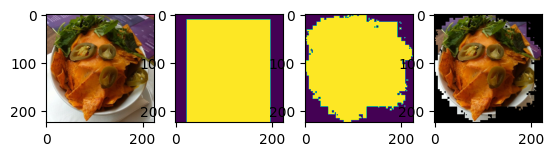

IOU score: 0.7851033755779689
Jaccard score: 0.7851033755779689


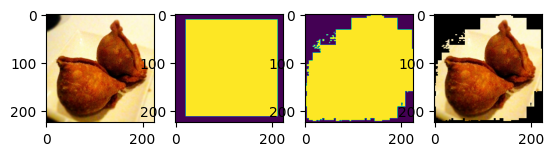

IOU score: 0.7881464238440823
Jaccard score: 0.7881464238440823


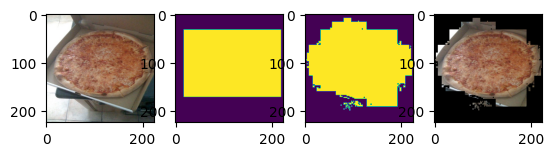

IOU score: 0.7886530561434084
Jaccard score: 0.7886530561434084


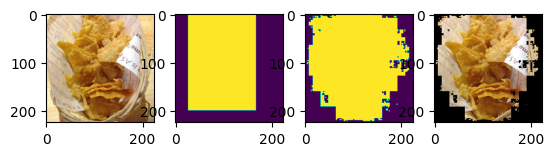

IOU score: 0.7211395101171459
Jaccard score: 0.7211395101171459


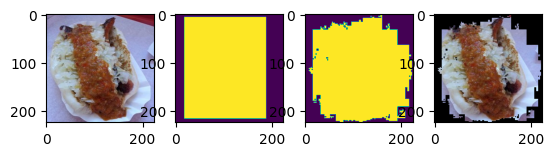

IOU score: 0.7995339138967251
Jaccard score: 0.7995339138967251


In [ ]:
for j in range(0, 5):
  i = random.randint(1, y_test.shape[0])
  ImageUtils.plot_images([X_test[i], y_test[i], y_test_pred_masks[i], y_test_pred_masked_images[i]])
  print("IOU score: {}".format(SegmentationUtils.iou_score(y_test[i], y_test_pred_masks[i])))
  print("Jaccard score: {}".format(SegmentationUtils.jscore(y_test[i], y_test_pred_masks[i])))

# **Milestone 2 : RCNN ( Model 8 )**

## Import

---



In [ ]:
import warnings
import random
import pandas as pd
import numpy as np
import zipfile
import shutil
from google.colab import drive, files
from io import BytesIO
import cv2
import torch.optim as optim
from torch.utils.data import DataLoader,Dataset
import torch
from torchvision import transforms
from PIL import Image
import os
import tensorflow as tf

# visualization support
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# sci-kit learn
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler

In [ ]:
def mount_gdrive():
  drive.mount('/content/drive/',force_remount=True)

def flush_n_reload_gdrive():
  drive.flush_and_unmount()
  mount_gdrive()

In [ ]:
mount_gdrive()

Mounted at /content/drive/


## Data processing

---



In [ ]:
def preprocess_image(image_data,pre=True):
    image = tf.image.decode_jpeg(image_data, channels=3)
    if pre==True:
      image = tf.keras.applications.resnet50.preprocess_input(image)
    image_array = np.array(image)
    return image_array

In [ ]:
import os
import zipfile
import pandas as pd
from io import BytesIO

def process_zip(zip_file_path, output_path, pre=True):
    image_data = {}
    imgcnt=0
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        folder_names = set(os.path.dirname(file_info.filename) for file_info in zip_ref.infolist())
        for folder_name in folder_names:
            print(folder_name)
            csv_file_name = os.path.join(folder_name, f"{folder_name}.csv")
            if csv_file_name in zip_ref.namelist():
                annotation_data = zip_ref.read(csv_file_name)
                annotations = pd.read_csv(BytesIO(annotation_data), usecols=range(1, 6), header=0)
                for file_info in zip_ref.infolist():
                    current_folder = os.path.dirname(file_info.filename)
                    imgcnt +=1
                    if current_folder == folder_name and file_info.filename.endswith('.jpg'):
                        img = file_info.filename.split("/")[1]
                        image_annotations = annotations[annotations['image_name'] == img].iloc[:, :4].values.tolist()
                        # Add annotations to image_data using image name as key
                        if img not in image_data:
                            image_data[img] = {
                                "image_name": img,
                                "label": folder_name,
                                "image": preprocess_image(zip_ref.read(file_info), pre),
                                "annotations": []
                            }
                        # Append annotations to the annotations list for the current image
                        image_data[img]["annotations"].extend(image_annotations)

    # Convert dictionary values to list of dictionaries
    image_data_list = list(image_data.values())
    for img in image_data_list:
    out_file = "raw_ann.npy" if pre == False else "data1.npy"
    npy_file_path = os.path.join(output_path, out_file)
    np.save(npy_file_path, image_data_list)


In [ ]:
output_folder = "/content/drive/My Drive/capstone/npz10"
zip_file_path = "/content/drive/My Drive/capstone/resize11.zip"
process_zip(zip_file_path, output_folder,False)

## X,y Creation with selective search

In [ ]:
output_folder = "/content/drive/My Drive/capstone/npz10/"
# load the npy and create X,y
file_path = os.path.join(output_folder, "raw_ann.npy")
data = np.load(file_path,allow_pickle=True)
X_data = []
labels = []
annotations = []
image_names = []
for image_data in data:
  img_name = image_data['image_name']
  lbl = image_data['label']
  img = image_data['image']
  ann = image_data['annotations']
  for i, ann_data in enumerate(ann):
    image_names.append(img_name)
    X_data.append(img)
    labels.append(lbl)
    annotations.append(ann_data)

# Create X variable by stacking the array
X = np.stack(X_data, axis=0)
labels = np.stack(labels, axis=0)
annotations = np.stack(annotations)

print(X.shape)
print(labels.shape)
print(annotations.shape)

(1073, 224, 224, 3)
(1073,)
(1073, 4)


In [ ]:
num_classes = 10

# Convert class names to categorical values
encoder = LabelEncoder()
y_enc = encoder.fit_transform(labels)
print(np.unique(y_enc))

# Save the mapping of categorical values to original values
label_mapping = dict(zip(range(len(encoder.classes_)), encoder.classes_))
print(label_mapping)

[0 1 2 3 4 5 6 7 8 9]
{0: 'chocolate_cake', 1: 'donut', 2: 'hot_dog', 3: 'nacho', 4: 'onion_ring', 5: 'pancake', 6: 'pizza', 7: 'samosa', 8: 'spring_roll', 9: 'strawberry_shortcake'}


In [ ]:
def selective_search(input_image,num_regions=300):
    cv2.setUseOptimized(True)
    ss_object = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss_object.setBaseImage(input_image)
    ss_object.switchToSelectiveSearchFast()
    rects = ss_object.process()
    return rects[:num_regions]

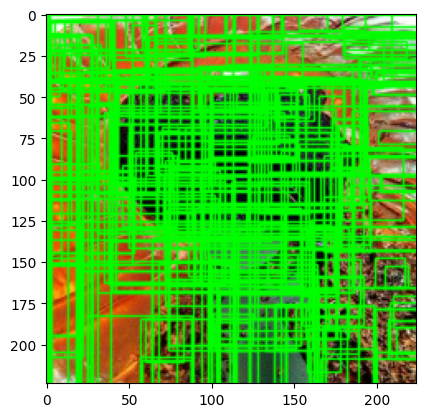

In [ ]:
def show_bounding_box(input_image):
    new_input_image = input_image.copy()
    rects = selective_search(new_input_image)
    for i, rect in (enumerate(rects)):
        x, y, w, h = rect
        cv2.rectangle(new_input_image, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
    plt.figure()
    plt.imshow(new_input_image)

input_image = X[0]
show_bounding_box(input_image)

In [ ]:
from keras import backend as K
def calculate_iou(box1, box2):
    # Determine the coordinates of the intersection rectangle
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    if x2 < x1 or y2 < y1:
        return 0.0

    # Calculate intersection area
    intersection_width = max(0, x2 - x1)
    intersection_height = max(0, y2 - y1)
    intersection_area = intersection_width * intersection_height

    # Calculate area of each bounding box
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Calculate union area
    union_area = box1_area + box2_area - intersection_area

    # Calculate IoU
    iou = intersection_area / (union_area + K.epsilon())
    return iou

In [ ]:
train_data=[]
labels_data=[]
ious=[]
selected_iou=[]
MAX_REGION_PROPOSALS = 300
for idx, image in enumerate(X):
  try:
    prs_img = f"{image_names[idx]} \t {labels[idx]} \t {y_enc[idx]}"
    coordinates=[]
    a = annotations[idx]
    bb= np.array([a[0], a[1], (a[0] + a[2]), (a[1] + a[3])])
    coordinates.append(bb)
    results = selective_search(image)
    image_new = image.copy()
    samples = 0
    random.shuffle(results)
    for region,ss_coordinate in enumerate(results):
      if region < MAX_REGION_PROPOSALS:
        for cc in coordinates:
          x,y,w,h = ss_coordinate
          iou = calculate_iou(cc,np.array([x, y, x+w, y+h]))
          ious.append(iou)
          if samples < 100 and iou > 0.5:
              new_img = image_new[y:y+h,x:x+w]
              resized_image = cv2.resize(new_img, (224,224), interpolation = cv2.INTER_AREA)
              train_data.append(resized_image)
              labels_data.append(y_enc[idx])
              selected_iou.append(iou)
              samples += 1

  except Exception as e:
    print(f"Error found : {e} in {prs_img}" )

##### Features

In [ ]:
# define independent and target features
X_new = np.array(train_data)
y_new = np.array(labels_data)

print(X_new.shape, y_new.shape, "unique classes : ", np.unique(y_new))

(7725, 224, 224, 3) (7725,) unique classes :  [0 1 2 3 4 5 6 7 8 9]


##### IoU distributions : overall vs selected images

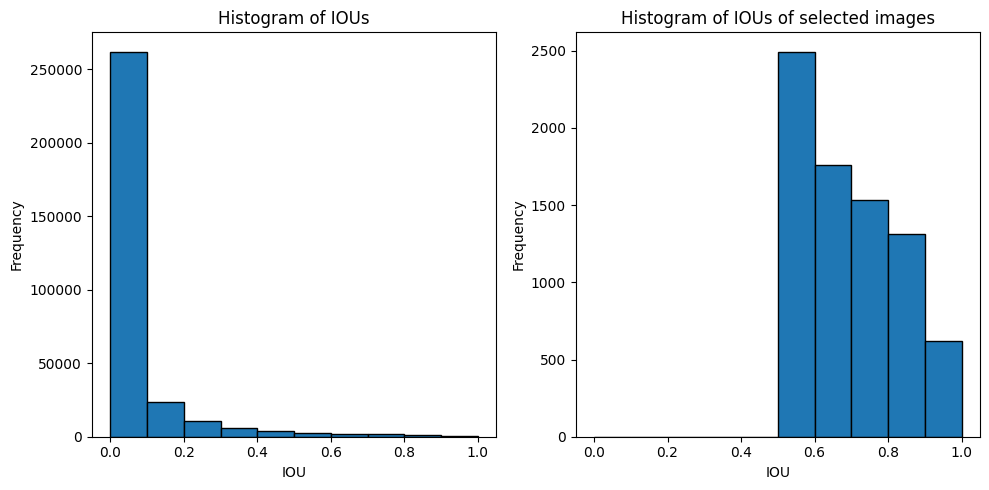

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot first histogram
axs[0].hist(ious, bins=10, range=(0, 1), edgecolor='black')
axs[0].set_title('Histogram of IOUs')
axs[0].set_xlabel('IOU')
axs[0].set_ylabel('Frequency')
axs[0].grid(False)

# Plot second histogram
axs[1].hist(selected_iou, bins=10, range=(0, 1), edgecolor='black')
axs[1].set_title('Histogram of IOUs of selected images')
axs[1].set_xlabel('IOU')
axs[1].set_ylabel('Frequency')
axs[1].grid(False)

# Adjust layout
plt.tight_layout()
# Show plot
plt.show()

## Model Definition

In [ ]:
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
import cv2

from keras import backend as K
from keras.applications import ResNet50
from keras.applications.vgg16 import VGG16
from keras.layers import Dense,Input, Dropout, InputLayer, BatchNormalization, Flatten, GlobalAveragePooling2D, Conv2D, MaxPool2D, GlobalMaxPool2D, Concatenate
from keras.models import Sequential, Model
from keras.optimizers import Adam, RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger
from keras.metrics import categorical_accuracy,categorical_crossentropy, IoU


# Define input shape
input_shape = (224, 224, 3)

# Load ResNet50 with pre-trained ImageNet weights
resnet_model = ResNet50(weights='imagenet', include_top=False,input_shape=input_shape)
for layer in resnet_model.layers[:-2]:
  layer.trainable = False

# Add classification head
x = resnet_model.output
x = GlobalMaxPool2D()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
classification = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=resnet_model.input, outputs=classification)
model.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=["accuracy"])

# Print the model summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

### Model training dataset creation

In [ ]:
print(X_new.shape, y_new.shape)
y_rcnn = to_categorical(y_new, num_classes=10)

# Split the data into train, test, and validation sets
X_rcnn_train, X_rcnn_test, y_rcnn_train, y_rcnn_test  = train_test_split(X_new, y_rcnn, test_size=0.3,stratify=y_new, random_state=18)
print(X_rcnn_train.shape,X_rcnn_test.shape,y_rcnn_train.shape,y_rcnn_test.shape)

X_rcnn_train1, X_rcnn_val, y_rcnn_train1, y_rcnn_val  = train_test_split(X_rcnn_train, y_rcnn_train, test_size=0.3,stratify=y_rcnn_train, random_state=18)
print(X_rcnn_train1.shape,X_rcnn_val.shape,y_rcnn_train1.shape,y_rcnn_val.shape)


(7725, 224, 224, 3) (7725,)
(5407, 224, 224, 3) (2318, 224, 224, 3) (5407, 10) (2318, 10)
(3784, 224, 224, 3) (1623, 224, 224, 3) (3784, 10) (1623, 10)


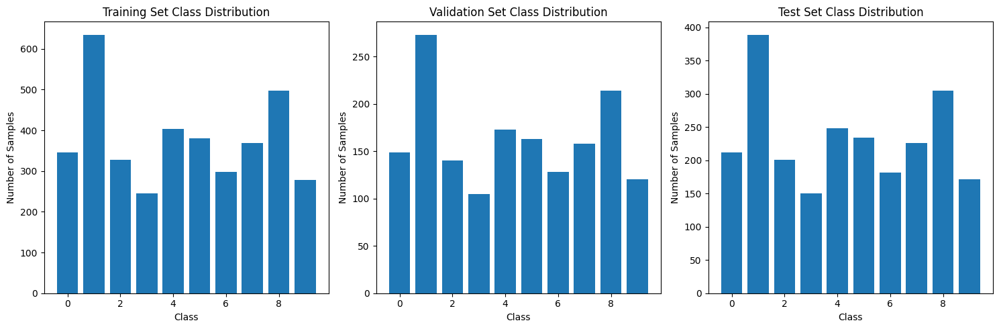

Class Imbalance Ratios for Training Set: [0.09143763 0.16781184 0.08668076 0.06501057 0.10676533 0.1006871
 0.07875264 0.09751586 0.13160677 0.0737315 ]
Class Imbalance Ratios for Validation Set: [0.0918053  0.16820702 0.08626001 0.06469501 0.10659273 0.1004313
 0.0788663  0.09735059 0.13185459 0.07393715]
Class Imbalance Ratios for Test Set: [0.09145815 0.16781708 0.08671268 0.06471096 0.10698878 0.10094909
 0.07851596 0.09749784 0.13157895 0.07377049]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Count samples per class for training set
unique_classes_train, class_counts_train = np.unique(y_rcnn_train1.argmax(axis=1), return_counts=True)

# Count samples per class for validation set
unique_classes_val, class_counts_val = np.unique(y_rcnn_val.argmax(axis=1), return_counts=True)

# Count samples per class for test set
unique_classes_test, class_counts_test = np.unique(y_rcnn_test.argmax(axis=1), return_counts=True)

# Visualize class distribution for training set
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.bar(unique_classes_train, class_counts_train)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Training Set Class Distribution')

# Visualize class distribution for validation set
plt.subplot(1, 3, 2)
plt.bar(unique_classes_val, class_counts_val)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Validation Set Class Distribution')

# Visualize class distribution for test set
plt.subplot(1, 3, 3)
plt.bar(unique_classes_test, class_counts_test)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Test Set Class Distribution')

plt.tight_layout()
plt.show()

# Calculate class imbalance ratio
class_imbalance_ratio_train = class_counts_train / len(y_rcnn_train1)
class_imbalance_ratio_val = class_counts_val / len(y_rcnn_val)
class_imbalance_ratio_test = class_counts_test / len(y_rcnn_test)

print("Class Imbalance Ratios for Training Set:", class_imbalance_ratio_train)
print("Class Imbalance Ratios for Validation Set:", class_imbalance_ratio_val)
print("Class Imbalance Ratios for Test Set:", class_imbalance_ratio_test)


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_class_weight

# Calculate class weights
classes = np.unique(y_rcnn_train1.argmax(axis=1))
data = y_rcnn_train1.argmax(axis=1)
class_weights = compute_class_weight('balanced',classes=classes ,y=data)

# Convert class weights to dictionary format
class_weight_dict = dict(enumerate(class_weights))

#### Data Augmentation

---

*creating test train val datasets*

In [ ]:
trdata = ImageDataGenerator(
    rotation_range=60             # Rotate images randomly by up to 60 degrees
    ,width_shift_range=0.1        # Shift images horizontally by up to 10% of the width
    ,height_shift_range=0.1       # Shift images vertically by up to 10% of the height
    ,shear_range=0.2              # Shear transformations with a maximum of 20% intensity
    ,zoom_range=0.2               # Zoom images by up to 20% randomly
    ,horizontal_flip=True         # Flip images horizontally with a probability of 0.5
    ,vertical_flip=True           # Flip images vertically with a probability of 0.5
    ,brightness_range=[0.5, 1.5]  # Adjust brightness randomly within the range [0.5, 1.5]
    ,channel_shift_range=20       # Randomly shift RGB channels by up to 20 intensity units
    ,fill_mode='nearest'          # Strategy for filling in newly created pixels after transformations
    #,rescale=1./255               # Rescale pixel values to the range [0, 1]
)

train_data = trdata.flow(X_rcnn_train1, y_rcnn_train1, batch_size=32)

vdata = ImageDataGenerator()
val_data = vdata.flow(x=X_rcnn_val, y=y_rcnn_val, batch_size=32)


tsdata = ImageDataGenerator()
test_data = trdata.flow(x=X_rcnn_test, y=y_rcnn_test, batch_size=32)


#### Model Checkpointing and training

In [ ]:
checkpoints = ModelCheckpoint("rcnn.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq="epoch")
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=5, verbose=1, mode='auto')
history = model.fit(train_data, steps_per_epoch=len(train_data), epochs=15, validation_data=val_data, validation_steps=len(val_data), callbacks=[checkpoints, early], class_weight=class_weight_dict)

Epoch 1/15
119/119 [==============================] - ETA: 0s - loss: 1.3181 - accuracy: 0.5632
Epoch 1: val_accuracy improved from -inf to 0.78743, saving model to rcnn.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


119/119 [==============================] - 85s 631ms/step - loss: 1.3181 - accuracy: 0.5632 - val_loss: 0.6451 - val_accuracy: 0.7874
Epoch 2/15
119/119 [==============================] - ETA: 0s - loss: 0.6526 - accuracy: 0.7799
Epoch 2: val_accuracy improved from 0.78743 to 0.83118, saving model to rcnn.h5
119/119 [==============================] - 74s 627ms/step - loss: 0.6526 - accuracy: 0.7799 - val_loss: 0.4598 - val_accuracy: 0.8312
Epoch 3/15
119/119 [==============================] - ETA: 0s - loss: 0.4898 - accuracy: 0.8298
Epoch 3: val_accuracy improved from 0.83118 to 0.88971, saving model to rcnn.h5
119/119 [==============================] - 73s 618ms/step - loss: 0.4898 - accuracy: 0.8298 - val_loss: 0.3391 - val_accuracy: 0.8897
Epoch 4/15
119/119 [==============================] - ETA: 0s - loss: 0.3899 - accuracy: 0.8684
Epoch 4: val_accuracy improved from 0.88971 to 0.90203, saving model to rcnn.h5
119/119 [==============================] - 67s 567ms/step - loss: 0.38

#### Model persistence, pickling and reload

In [ ]:
from keras.models import load_model
model.save("/content/drive/My Drive/rcnn/rcnn101_model")
model.save_weights("/content/drive/My Drive/rcnn/rcnn101_weights")

In [ ]:
loaded_model = load_model('/content/drive/My Drive/rcnn/rcnn101_model')
loaded_model.load_weights("/content/drive/My Drive/rcnn/rcnn101_weights")

In [ ]:
import pickle

# Save the Keras model using pickle
with open("/content/drive/My Drive/rcnn/rcnn_101_model.pkl", "wb") as f:
    pickle.dump(model, f)

#### Model Evaluation

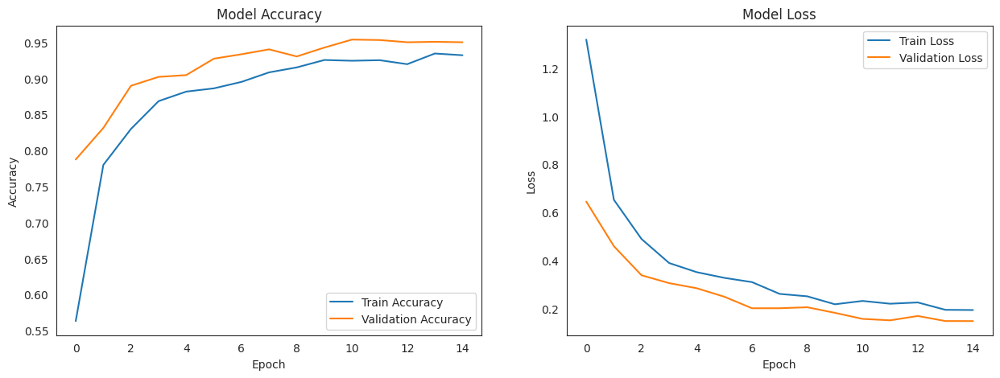

In [ ]:
df_history = pd.DataFrame(history.history)
sns.set_style("white")

# Plot loss vs accuracy across epochs for training and validation sets
plt.figure(figsize=(15, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(df_history['accuracy'], label='Train Accuracy')
plt.plot(df_history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(df_history['loss'], label='Train Loss')
plt.plot(df_history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
# Evaluate the model on the test set
test_class_loss, test_class_accuracy = model.evaluate(test_data)

73/73 [==============================] - 37s 504ms/step - loss: 0.2378 - accuracy: 0.9154


In [ ]:
# Accuracy Metrics for train and test
final_training_accuracy =df_history['accuracy'].iloc[-1]
print("Training Classification Accuracy:", final_training_accuracy,"\n\n")

# Print evaluation results
print("Test Classification Accuracy:", test_class_accuracy)
print("Test Classification Loss:", test_class_loss)

Training Classification Accuracy: 0.93208247423172 


Test Classification Accuracy: 0.9154443740844727
Test Classification Loss: 0.2377629280090332


#### Model Testing

1/1 [==============================] - 2s 2s/step
The class index:0, name: chocolate_cake

The probablilities for each class are  [[9.9953699e-01 7.5323398e-05 2.8552480e-05 3.1052095e-05 2.9078816e-08
  3.2157681e-04 4.0789946e-06 1.5727888e-08 5.0846589e-09 2.4429348e-06]]


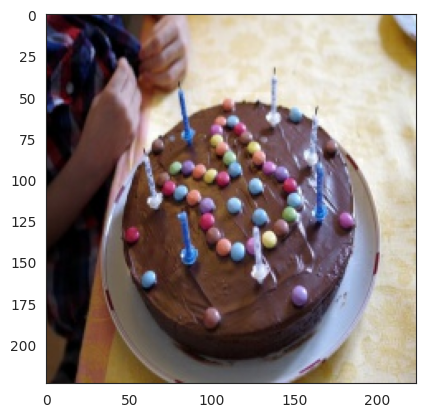

In [ ]:
imgs = X[10]
plt.imshow(imgs)
img = np.expand_dims(imgs, axis=0)
class_pred = model.predict(img)
res = np.argmax(class_pred)

print(f"The class index:{res}, name: {label_mapping[res]}")
print("\nThe probablilities for each class are ",class_pred)

##### Using high probalistic regions

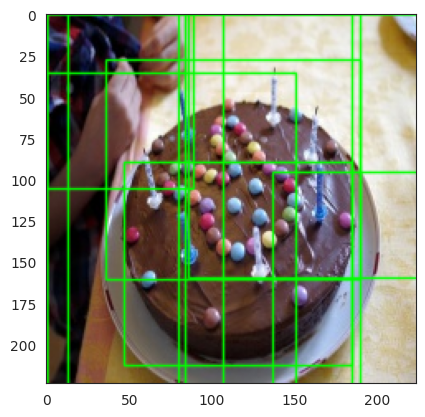

In [ ]:
ssresults = selective_search(imgs)
img_new = imgs.copy()
match_res=[]
probs=[]
for i,result in enumerate(ssresults):
    x,y,w,h = result
    timage = img_new[y:y+h,x:x+w]
    resized_image = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized_image, axis=0)
    prediction = model.predict(img, verbose=None)
    nres = np.argmax(prediction)
    pmatch = np.max(prediction)
    if pmatch > 0.9:
      match_res.append(nres)
      probs.append(pmatch)
    if(pmatch > 0.9 and nres==res):
      cv2.rectangle(img_new, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)

if(len(match_res)>0):
  plt.figure()
  plt.imshow(img_new)

##### Using non_max_suppression

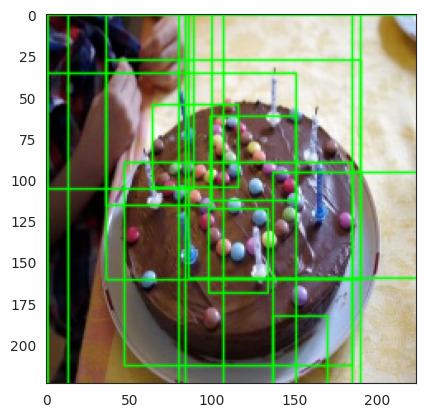

In [ ]:
# Import necessary library
from imutils.object_detection import non_max_suppression

# Define lists to store filtered bounding boxes and corresponding probabilities
filtered_boxes = []
filtered_probs = []

# Iterate over the region proposals and corresponding probabilities
for i, result in enumerate(ssresults):
    x, y, w, h = result
    timage = img_new[y:y+h, x:x+w]
    resized_image = cv2.resize(timage, (224, 224), interpolation=cv2.INTER_AREA)
    img = np.expand_dims(resized_image, axis=0)
    prediction = model.predict(img, verbose=None)
    nres = np.argmax(prediction)
    pmatch = np.max(prediction)

    # Filter out bounding boxes with confidence below a certain threshold
    if pmatch > 0.9:
        filtered_boxes.append([x, y, x+w, y+h])
        filtered_probs.append(pmatch)

# Apply non-max suppression to merge overlapping bounding boxes
boxes = np.array(filtered_boxes)
probs = np.array(filtered_probs)
selected_boxes = non_max_suppression(boxes, probs)

# Draw bounding boxes on the original image
for (startX, startY, endX, endY) in selected_boxes:
    cv2.rectangle(img_new, (startX, startY), (endX, endY), (0, 255, 0), 1, cv2.LINE_AA)

# Show the image with reduced and filtered bounding boxes
plt.figure()
plt.imshow(img_new)

In [ ]:
# Make predictions on the test dataset
predictions = model.predict(test_data)

# Convert predictions to class labels
predicted_labels = tf.argmax(predictions, axis=1).numpy()

73/73 [==============================] - 36s 474ms/step


[0 1 2 3 4 5 6 7 8 9]  predicted classes from original classes  [0 1 2 3 4 5 6 7 8 9] 

Confusion Matrix:


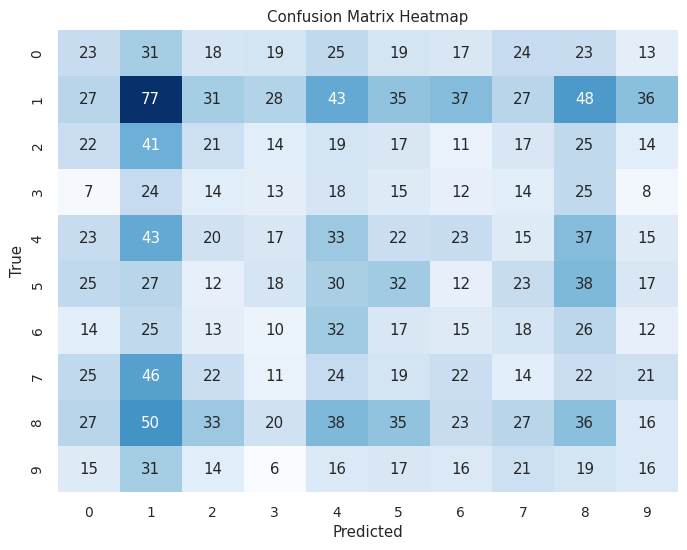

In [ ]:
from sklearn.metrics import classification_report
true_labels = np.argmax(y_rcnn_test, axis=1)

true_class_names = [label_mapping[label] for label in true_labels]
predicted_class_names = [label_mapping[label] for label in predicted_labels]


cm = confusion_matrix(true_labels, predicted_labels)
print("Confusion Matrix:")
plt.figure(figsize=(8, 6))
sns.set(font_scale=.9)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False);
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [ ]:
#Calculate classification metrics
report = classification_report(true_class_names, predicted_class_names, output_dict=True)
df_report = pd.DataFrame(report)
df_report.T

,precision,recall,f1-score,support
chocolate_cake,0.110577,0.108491,0.109524,212.000000
donut,0.194937,0.197943,0.196429,389.000000
hot_dog,0.106061,0.104478,0.105263,201.000000
nacho,0.083333,0.086667,0.084967,150.000000
onion_ring,0.118705,0.133065,0.125475,248.000000
pancake,0.140351,0.136752,0.138528,234.000000
pizza,0.079787,0.082418,0.081081,182.000000
samosa,0.070000,0.061947,0.065728,226.000000
spring_roll,0.120401,0.118033,0.119205,305.000000
strawberry_shortcake,0.095238,0.093567,0.094395,171.000000


# **Milestone 2 : Yolo (Model 9)**

## Mount gdrive

---



In [ ]:
from google.colab import drive,files
drive.mount("/content/drive",force_remount=True)

Mounted at /content/drive


In [ ]:
import os

# path in your Google Drive to save the trained model
output_dir = "/content/drive/My Drive/results/trained_models"
os.makedirs(output_dir, exist_ok=True)


## Setup environment

---

*clone yolov5 and setup all requirements*

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5/
%pip install -qr requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.0/715.0 kB 48.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.6 MB/s eta 0:00:00


In [ ]:
import utils
import torch
from IPython.display import Image, clear_output
display = utils.notebook_init()

YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.4/78.2 GB disk)


## Train

---

*initialize parameters *

In [ ]:
"""
  img: define input image size
  batch: determine batch size
  epochs: define the number of training epochs. (Note: often, 3000+ are common here!)
  data: set the path to our yaml file
  cfg: specify our model configuration
  weights: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)
  name: result names
  nosave: only save the final checkpoint
  cache: cache images for faster training
"""
%cd /content/yolov5/

# Set the project name and model name
PROJECT_NAME = "food_detect"
MODEL_NAME = "f101_yv5s"
DATA_FILE = "/content/drive/My\ Drive/conf/data.yaml"
BASE_MODEL = "yolov5s.pt"
TRAIN_BATCH = 32
TRAIN_EPOCHS = 200
VAL_BATCH = 32

# Run training with the modified parameters
!python train.py --img 224 --batch {TRAIN_BATCH} --epochs {TRAIN_EPOCHS} --data {DATA_FILE}  --weights {BASE_MODEL} --project {PROJECT_NAME} --name {MODEL_NAME} --cache --freeze 12 --nosave

/content/yolov5
2024-02-15 11:51:24.003812: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 11:51:24.003878: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 11:51:24.005528: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/My Drive/conf/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=32, imgsz=224, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=

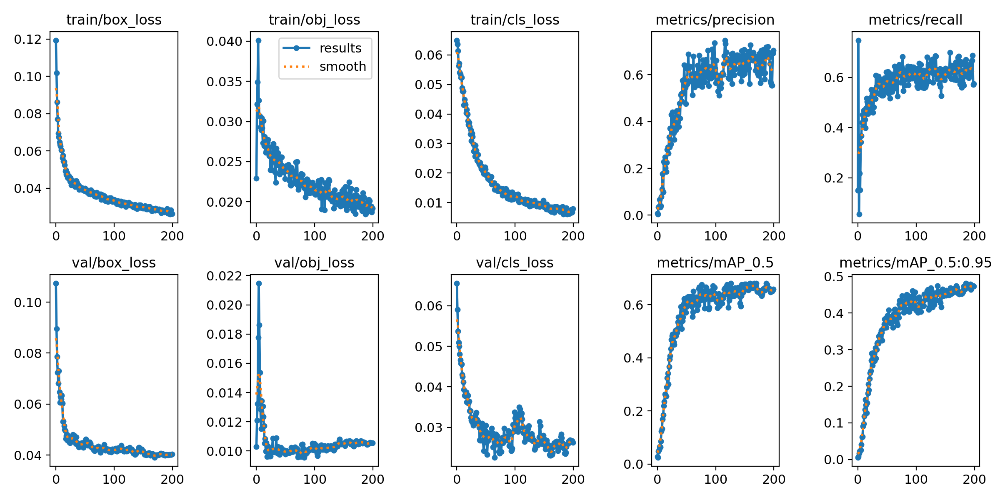

In [ ]:
from utils.plots import plot_images, plot_labels, plot_results

#plot_results('./food_detect/f101_yv5s/results.csv')
Image(filename='./food_detect/f101_yv5s/results.png', width=1000)

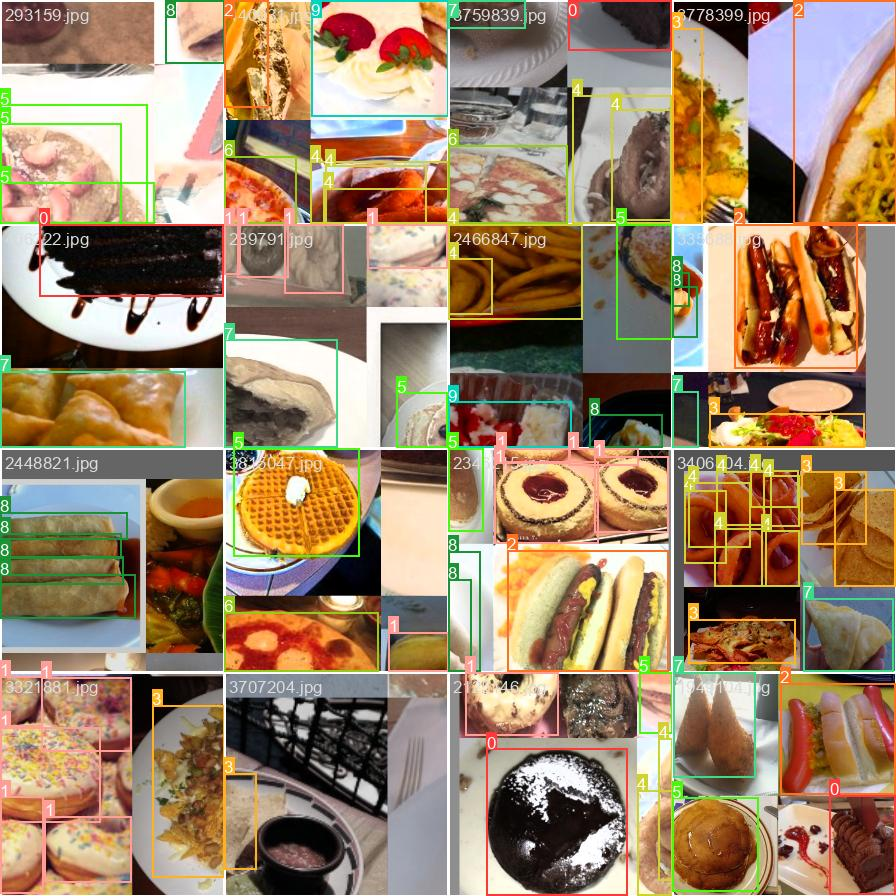

In [ ]:
# first, display our ground truth data
Image(filename='./food_detect/f101_yv5s/train_batch0.jpg', width=900)
Image(filename='./food_detect/f101_yv5s/train_batch1.jpg', width=900)
Image(filename='./food_detect/f101_yv5s/train_batch2.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls './food_detect/f101_yv5s/weights/'

last.pt


### Validate the flow

---

*use the best weights and apply threshold of iou of 0.65*

In [ ]:
# Path to save model weights file in Google Drive
model_weights_path = os.path.join(output_dir, f"{MODEL_NAME}.pt")

!python val.py --data "/content/drive/My Drive/conf/data.yaml" --weights "./food_detect/f101_yv5s/weights/last.pt" --img 256 --batch 32 --iou 0.65


val: data=/content/drive/My Drive/conf/data.yaml, weights=['./food_detect/f101_yv5s/weights/last.pt'], batch_size=32, imgsz=256, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/My Drive/images/val/labels.cache... 99 images, 0 backgrounds, 0 corrupt: 100% 99/99 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:04<00:00,  1.25s/it]
                   all         99        191      0.624      0.675      0.686      0.468
        chocolate_cake         99         10      0.619        0.6      0.695      0.413

## Test

---

*detect the objects and classes to which the images belong*

In [ ]:
TEST_DIR = "/content/drive/My\ Drive/images/test/images"
WEIGHTS = "./food_detect/f101_yv5s/weights/last.pt"

!python detect.py --source {TEST_DIR} --weights {WEIGHTS}  --img 256 --conf 0.5 --save-txt

detect: weights=['./food_detect/f101_yv5s/weights/last.pt'], source=/content/drive/My Drive/images/test/images, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/100 /content/drive/My Drive/images/test/images/26078.jpg: 256x256 1 samosa, 6.2ms
image 2/100 /content/drive/My Drive/images/test/images/2608975.jpg: 256x256 (no detections), 8.4ms
image 3/100 /content/drive/My Drive/images/test/images/2661647.jpg: 

Displaying the first 15 images:


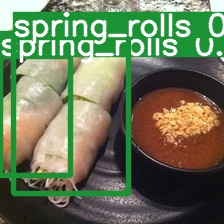

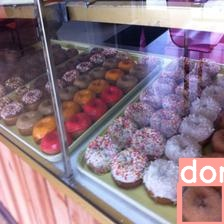

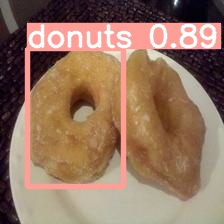

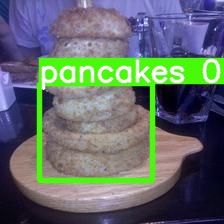

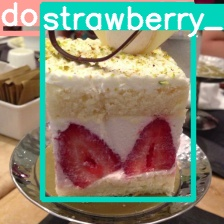

...

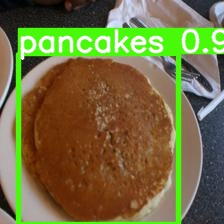

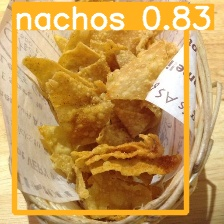

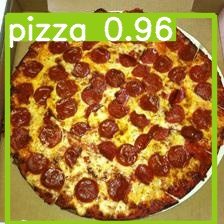

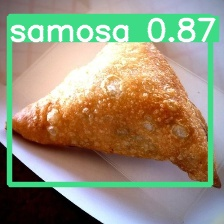

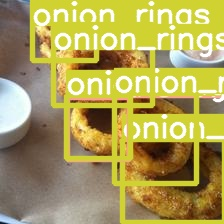

In [ ]:
import glob
from IPython.display import display, HTML, Image

try:
    image_filenames = glob.glob('/content/drive/My Drive/results/trained_models/runs/detect/exp/*.jpg')
    print("Displaying the first 15 images:")
    for i, filename in enumerate(image_filenames[:15]):
        display(Image(filename=filename))
except Exception as e:
    print("Error:", e)

In [ ]:
ground_truth_dir = '/content/drive/My Drive/images/test/labels/'
output_dir = '/content/drive/My Drive/results/trained_models/runs/detect/exp/labels/'


def calculate_classification_accuracy(output_dir, ground_truth_dir):
    output_files = [file for file in os.listdir(output_dir) if file.endswith('.txt')]
    ground_truth_files = [file for file in os.listdir(ground_truth_dir) if file.endswith('.txt')]

    total_objects = 0
    correctly_classified_objects = 0

    for output_file in output_files:
        if output_file in ground_truth_files:
            with open(os.path.join(output_dir, output_file), 'r') as output_f, \
                 open(os.path.join(ground_truth_dir, output_file), 'r') as truth_f:
                output_lines = output_f.readlines()
                truth_lines = truth_f.readlines()

                for output_line, truth_line in zip(output_lines, truth_lines):
                    output_label = output_line.strip().split()[0]
                    truth_label = truth_line.strip().split()[0]

                    total_objects += 1
                    if output_label == truth_label:
                        correctly_classified_objects += 1

    # Calculate classification accuracy
    if total_objects == 0:
        return 0.0
    print(f"Correctly classified : {correctly_classified_objects} out of {total_objects}")
    classification_accuracy = (correctly_classified_objects / total_objects) * 100
    return classification_accuracy

accuracy = calculate_classification_accuracy(output_dir, ground_truth_dir)
print("Classification Accuracy: {:.2f}%".format(accuracy))

Correctly classified : 123 out of 145
Classification Accuracy: 84.83%


## Export the model

In [ ]:
!python export.py --weights "/content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.pt" --include torchscript onnx


export: data=data/coco128.yaml, weights=['/content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from /content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.pt with output shape (1, 25200, 15) (13.6 MB)

TorchScript: starting export with torch 2.1.0+cu121...
TorchScript: export success ✅ 2.4s, saved as /content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.torchscript (27.3 MB)

ONNX: starting export with 

In [ ]:
!pip install netron


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 29.1 MB/s eta 0:00:00


In [ ]:
import netron
from IPython.display import display

onnx_model_path = '/content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.onnx'
%matplotlib inline
netron.start(onnx_model_path)

Serving '/content/drive/My Drive/results/trained_models/food_detect/f101_yv5s/weights/last.onnx' at http://localhost:17867


('localhost', 17867)

# **Convert to HTML**

In [ ]:
%%shell
jupyter nbconvert --to html '/content/Final_Capstone_Project_Notebook.ipynb'

[NbConvertApp] Converting notebook /content/Final_Capstone_Project_Notebook.ipynb to html
[NbConvertApp] Writing 13089564 bytes to /content/Final_Capstone_Project_Notebook.html
